# Predict houses prices

In [1]:
import pandas as pd #Data manipulation
import numpy as np #Linear albebra
import pycats #Categorical data

# Visulation
import matplotlib.pyplot as plt
import seaborn as sns
import scikitplot as skplt
import yellowbrick.regressor as rg

# Stadistics
from statsmodels.graphics.gofplots import qqplot
import pylab 
import scipy.stats as stat
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

# Machine Learning
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn import linear_model
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
import sklearn.metrics as metrics
import xgboost as xgb

# Some configurations
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
plt.style.use('ggplot')

C:\Users\azaze\Anaconda2\envs\myenv\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


In [2]:
def ECDF(data):
    """Computar ECDF para un array de una dimension."""
    
    n = len(data)
    x = np.sort(data)
    y = np.arange(1, n+1) / n

    return x, y

In [3]:
df = pd.read_csv('train.csv')

In [4]:
df.shape

(1460, 81)

In [5]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

## Data Wrangling

In [7]:
 df.isnull().mean().sort_values(ascending = False)[:20]

PoolQC          0.995205
MiscFeature     0.963014
Alley           0.937671
Fence           0.807534
FireplaceQu     0.472603
LotFrontage     0.177397
GarageCond      0.055479
GarageType      0.055479
GarageYrBlt     0.055479
GarageFinish    0.055479
GarageQual      0.055479
BsmtExposure    0.026027
BsmtFinType2    0.026027
BsmtFinType1    0.025342
BsmtCond        0.025342
BsmtQual        0.025342
MasVnrArea      0.005479
MasVnrType      0.005479
Electrical      0.000685
Utilities       0.000000
dtype: float64

In [8]:
for column in df.columns:
    if  df[column].isnull().mean() > 0.8:
        df.drop(column, axis = 1, inplace=True )      

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 77 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

In [10]:
df.shape

(1460, 77)

### NA values

In [11]:
list_cat = df.describe(include = 'O').columns

In [12]:
df.describe(include = 'O')

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
count,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1452,1460,1460,1460,1423,1423,1422,1423,1422,1460,1460,1460,1459,1460,1460,770,1379,1379,1379,1379,1460,1460,1460
unique,5,2,4,4,2,5,3,25,9,8,5,8,6,8,15,16,4,4,5,6,4,4,4,6,6,6,5,2,5,4,7,5,6,3,5,5,3,9,6
top,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,PConc,TA,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Gd,Attchd,Unf,TA,TA,Y,WD,Normal
freq,1151,1454,925,1311,1459,1052,1382,225,1260,1445,1220,726,1141,1434,515,504,864,906,1282,647,649,1311,953,430,1256,1428,741,1365,1334,735,1360,380,870,605,1311,1326,1340,1267,1198


In [13]:
df[list_cat].isnull().sum() 

MSZoning           0
Street             0
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         8
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
KitchenQual        0
Functional         0
FireplaceQu      690
GarageType        81
GarageFinish      81
GarageQual        81
GarageCond        81
PavedDrive         0
SaleType           0
SaleCondition      0
dtype: int64

In [14]:
#WITHOUT GARAGE.
garage_vars = df[list_cat].columns[df[list_cat].columns.str.contains('Garage')].to_list()
for col in garage_vars:
    df[col].fillna('No', inplace= True)
    
#WITHOUT BSMT.
basement_vars = df[list_cat].columns[df[list_cat].columns.str.contains('Bsmt')].to_list()
for col in basement_vars:
    df[col].fillna('No', inplace= True)
    
#WITHOUT FIREPLACE.
df.FireplaceQu.fillna('None', inplace = True)
#---------------------------

df.MasVnrType.fillna('None', inplace = True)
df.Electrical.fillna('SBrkr', inplace = True)

In [15]:
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [20]:
list_num = df.drop(list_cat, axis = 1).columns  
for num_col in list_num:
    df[num_col].fillna(df[num_col].median(), inplace = True)

In [21]:
print(all(df.isnull().sum()== 0))


True


#### Feature Engineer 1 

In [22]:
df['Total_Square_Feet'] = (df['BsmtFinSF1'] + df['BsmtFinSF2'] + \
                                   df['1stFlrSF'] + df['2ndFlrSF'] + df['TotalBsmtSF'])

df['Total_Bath'] = (df['FullBath'] + (0.5 * df['HalfBath']) +\
                            df['BsmtFullBath'] + (0.5 * df['BsmtHalfBath']))

df['Total_Porch_Area'] = (df['OpenPorchSF'] + df['3SsnPorch'] + \
                                  df['EnclosedPorch'] + df['ScreenPorch'] + df['WoodDeckSF'])

df['exists_pool'] = df['PoolArea'].apply(lambda x: 1 if x > 0 else 0)
df['exists_garage'] = df['GarageArea'].apply(lambda x: 1 if x > 0 else 0)
df['exists_fireplace'] = df['Fireplaces'].apply(lambda x: 1 if x > 0 else 0)
df['exists_bsmt'] = df['TotalBsmtSF'].apply(lambda x: 1 if x > 0 else 0)
df['old_house'] = df['YearBuilt'].apply(lambda x: 1 if x <1990 else 0)


In [23]:
df.drop(['BsmtFinSF1', 'BsmtFinSF2', '1stFlrSF', '2ndFlrSF', 'TotalBsmtSF','FullBath','HalfBath', 'BsmtFullBath',\
        'BsmtHalfBath','OpenPorchSF', '3SsnPorch', 'EnclosedPorch', 'ScreenPorch','WoodDeckSF' ], axis = 1, inplace =True)
df1 = df.copy()

##### df1 is created to prepare the data with another approach

## EDA

Response variable analysis (SalePrice)


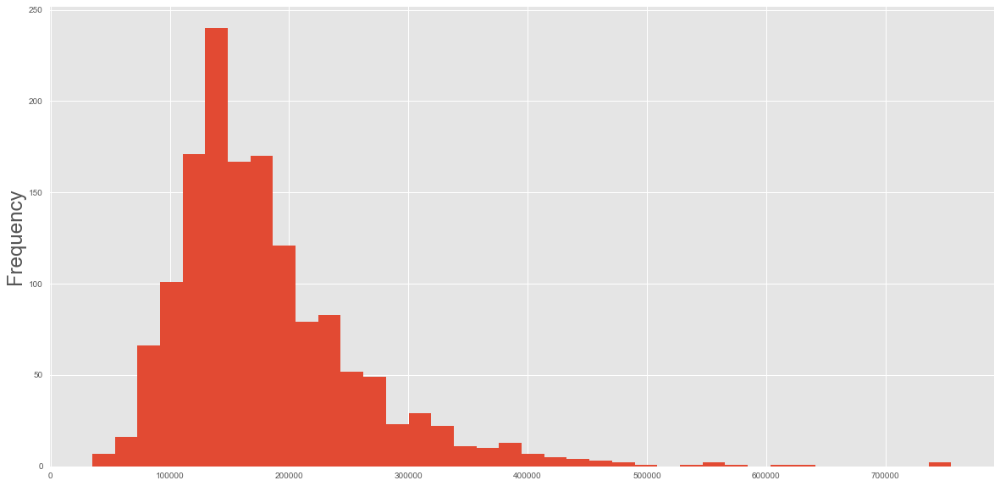

In [20]:

plt.style.use('ggplot')
plt.rcParams['font.size']=20
plt.figure(figsize=(20, 10))
df1.SalePrice.plot(kind = 'hist', bins =int(np.floor(np.sqrt(len(df1.SalePrice)))))
plt.show()

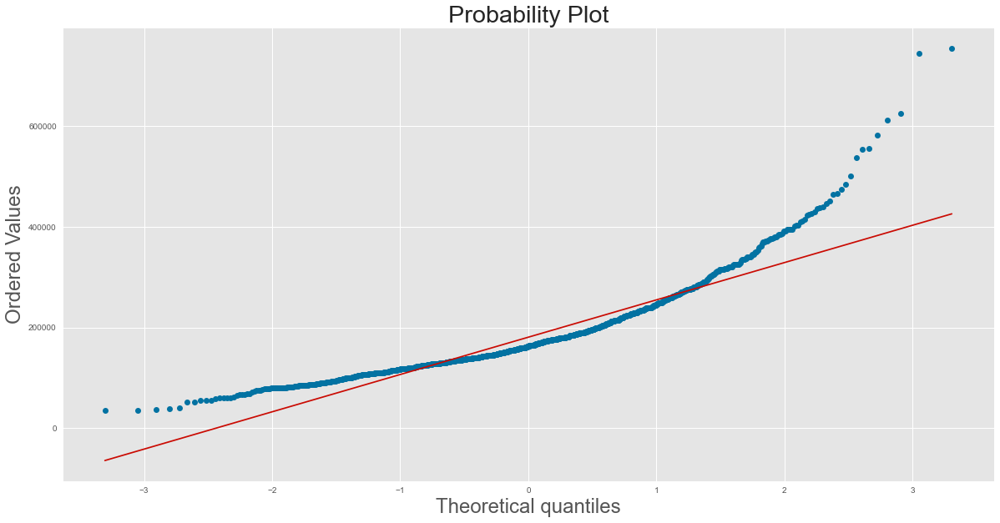

In [21]:
plt.figure(figsize=(20, 10))
stat.probplot(df1.SalePrice, dist="norm", plot=pylab)
pylab.show()

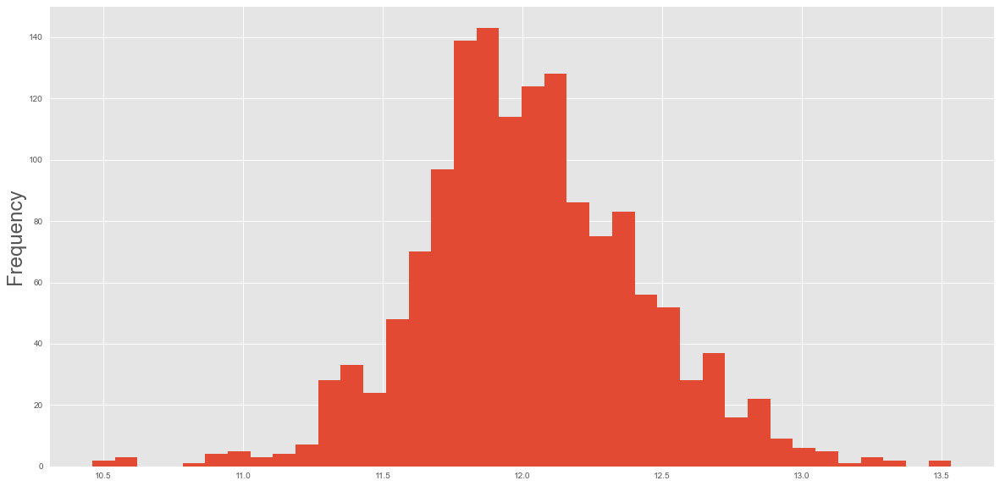

In [22]:
plt.figure(figsize=(20, 10))
np.log(df1.SalePrice).plot(kind = 'hist', bins =int(np.floor(np.sqrt(len(df1.SalePrice)))))
plt.show()

In [23]:
# stat.kstest(np.log(df1.SalePrice), 'norm',
#             args = (np.log(df1.SalePrice).mean(), np.log(df1.SalePrice).std())) 

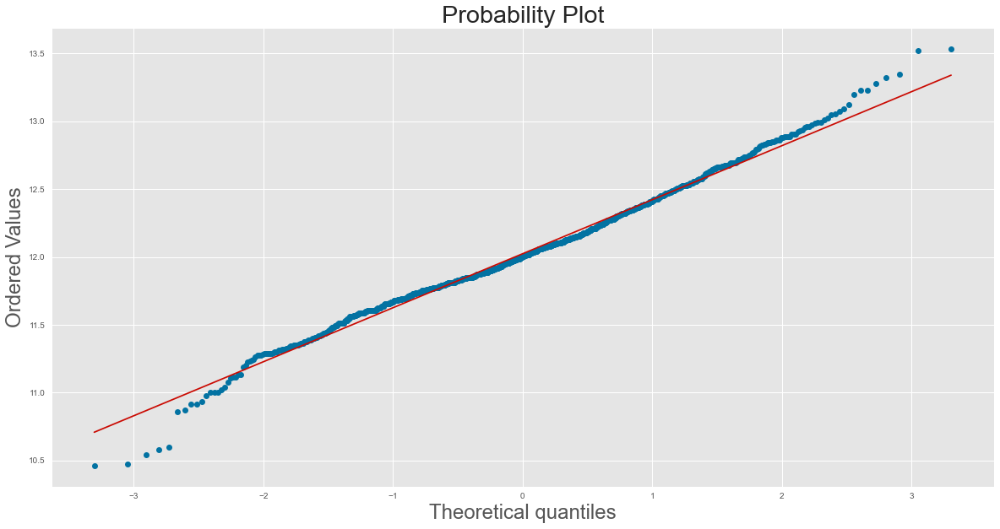

In [24]:
plt.figure(figsize=(20, 10))
stat.probplot(np.log(df1.SalePrice), dist="norm", plot=pylab)
pylab.show()

#### Applying a logarithmic transformation gives a good approximation to the normal distribution.

Correlation analysis: In the initial dataset there were 80 candidate variables, the fact of having so many variables can cause multicollinearity problems in case of using linear models.

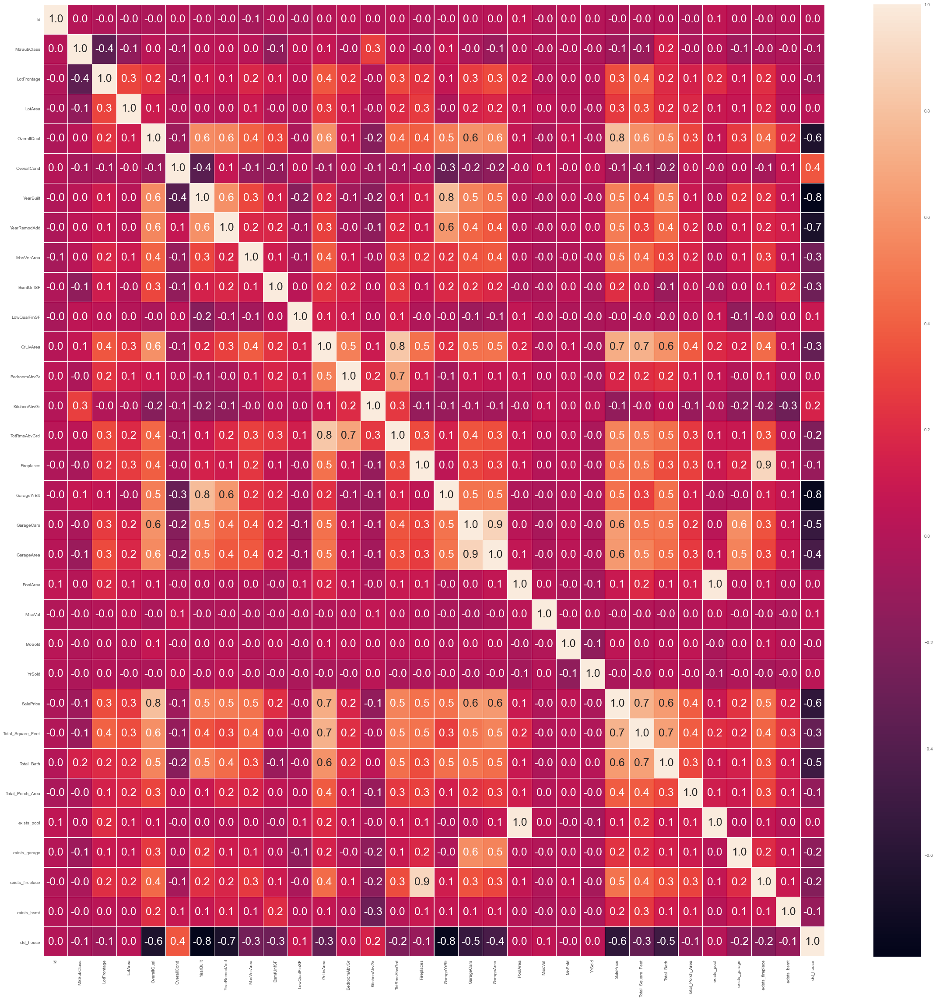

In [25]:
plt.figure(figsize=(40, 40))
sns.heatmap(df1.corr(), annot = True, linewidth = 0.2, annot_kws={"size": 25}, fmt='.1f')
plt.show()

In [24]:
x = add_constant(df1.drop('SalePrice',axis=1)[df1.drop('SalePrice',axis=1).describe().columns])
vif = pd.Series([variance_inflation_factor(x.values , i) 
               for i in range(x.shape[1])], 
              index = x.columns)[1:]
vif[vif >= 5]

YearBuilt             5.256971
GrLivArea             8.117445
Fireplaces            6.302290
GarageCars            6.183045
GarageArea            5.772478
PoolArea             54.860368
Total_Square_Feet     5.002804
exists_pool          56.375090
exists_fireplace      6.078216
dtype: float64

In [28]:
df1.drop(['PoolArea', 'GarageCars'] ,axis = 1, inplace = True)

In [29]:
x = add_constant(df1.drop('SalePrice',axis=1)[df1.drop('SalePrice',axis=1).describe().columns])
vif = pd.Series([variance_inflation_factor(x.values , i) 
               for i in range(x.shape[1])], 
              index = x.columns)[1:]
vif[vif >= 5]

YearBuilt    5.235681
GrLivArea    8.088976
dtype: float64

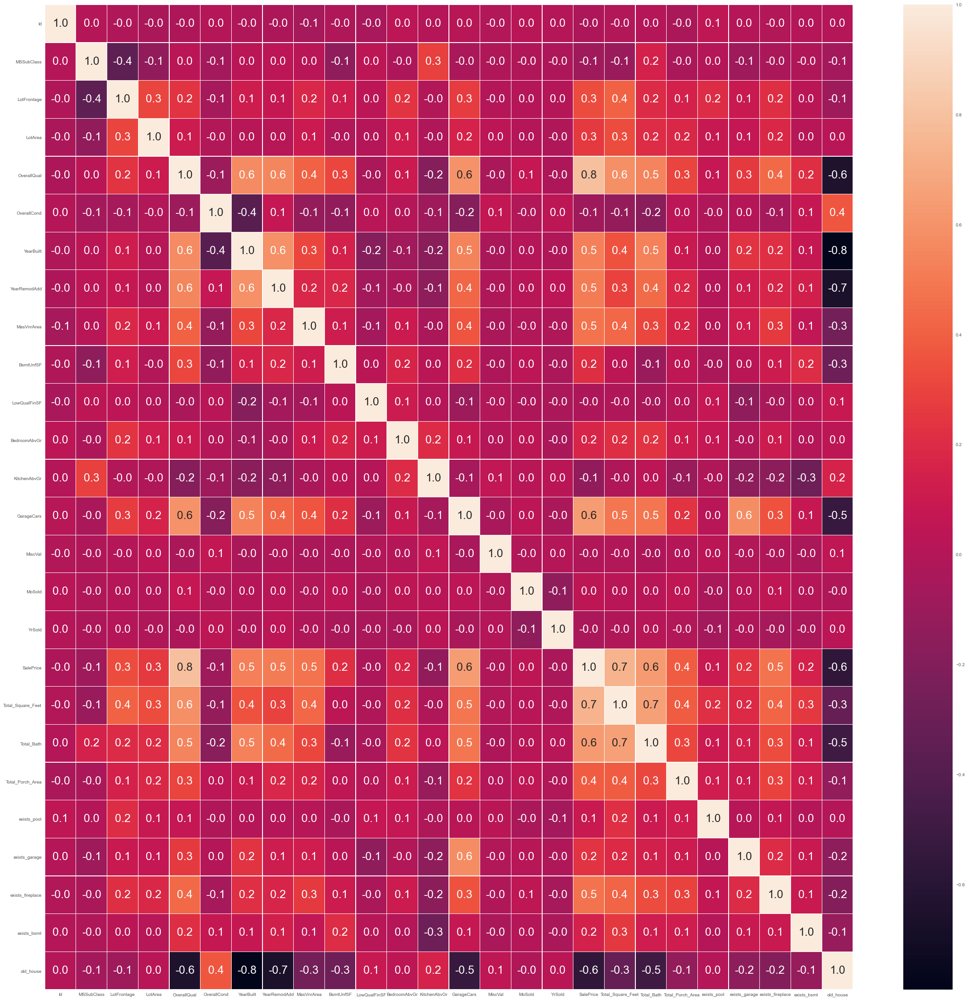

In [29]:
plt.figure(figsize=(40, 40))
sns.heatmap(df1.corr(), annot = True, linewidth = 0.2, annot_kws={"size": 25}, fmt='.1f')
plt.show()

In [30]:
# NO VARIABLE WITH CORRELATION SUPERIOR TO 0.8.
all(df1.corr()[df1.corr() > 0.8].sum() == 1.0)

True

## Data Visualization

In [30]:
# The data is divided into numerical and categorical
num_vars, cat_vars = [], []
for col in df.columns:
    print(col)
    print(df[col].nunique())
    if df[col].nunique() > 25:
        num_vars.append(col)
    else:
        cat_vars.append(col)

Id
1460
MSSubClass
15
MSZoning
5
LotFrontage
110
LotArea
1073
Street
2
LotShape
4
LandContour
4
Utilities
2
LotConfig
5
LandSlope
3
Neighborhood
25
Condition1
9
Condition2
8
BldgType
5
HouseStyle
8
OverallQual
10
OverallCond
9
YearBuilt
112
YearRemodAdd
61
RoofStyle
6
RoofMatl
8
Exterior1st
15
Exterior2nd
16
MasVnrType
4
MasVnrArea
327
ExterQual
4
ExterCond
5
Foundation
6
BsmtQual
5
BsmtCond
5
BsmtExposure
4
BsmtFinType1
7
BsmtFinType2
7
BsmtUnfSF
780
Heating
6
HeatingQC
5
CentralAir
2
Electrical
5
LowQualFinSF
24
GrLivArea
861
BedroomAbvGr
8
KitchenAbvGr
4
KitchenQual
4
TotRmsAbvGrd
12
Functional
7
Fireplaces
4
FireplaceQu
6
GarageType
7
GarageYrBlt
97
GarageFinish
4
GarageCars
5
GarageArea
441
GarageQual
6
GarageCond
6
PavedDrive
3
PoolArea
8
MiscVal
21
MoSold
12
YrSold
5
SaleType
9
SaleCondition
6
SalePrice
663
Total_Square_Feet
1125
Total_Bath
10
Total_Porch_Area
427
exists_pool
2
exists_garage
2
exists_fireplace
2
exists_bsmt
2
old_house
2


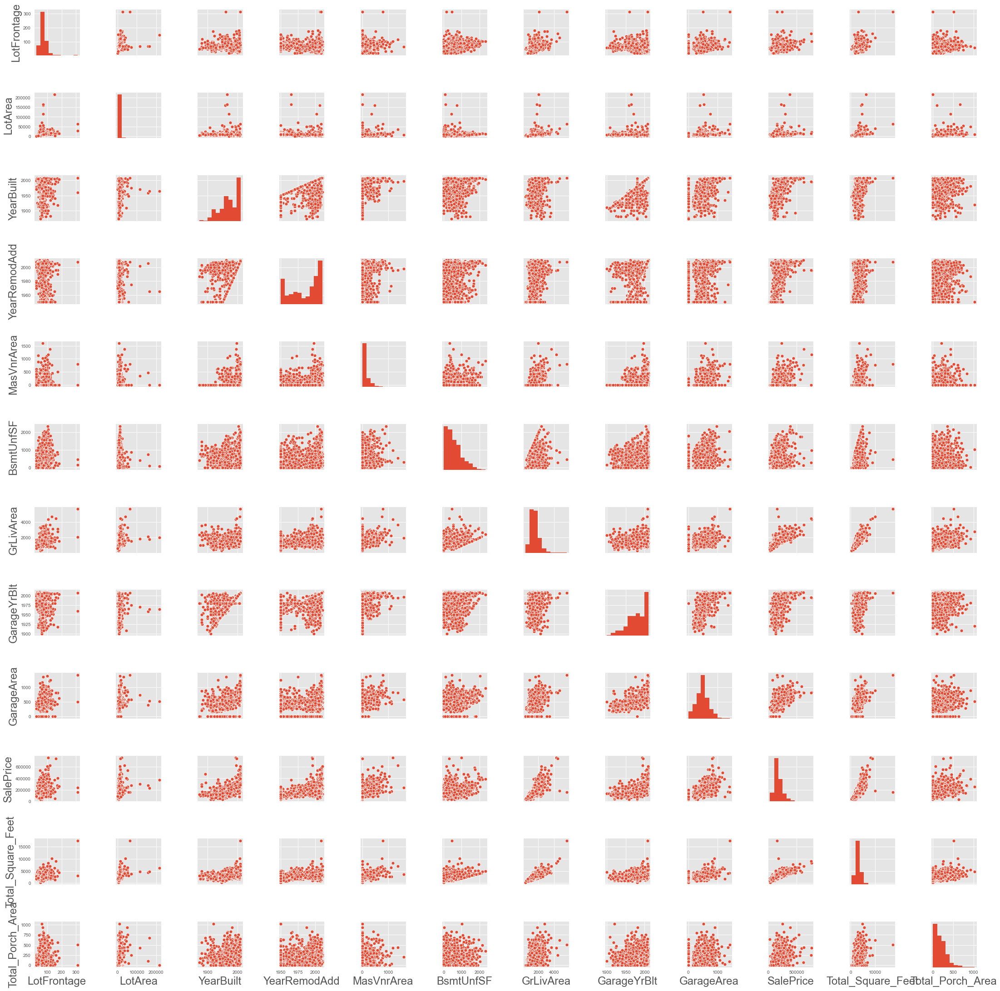

In [32]:
# PairPlot numerical data
sns.pairplot(df[num_vars].drop('Id', axis = 1))
plt.show()

### Univariate analysis

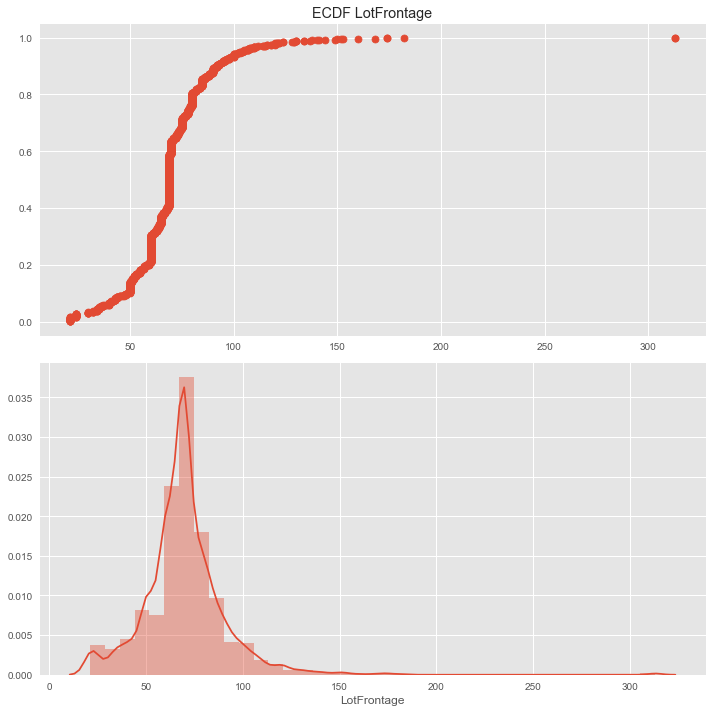

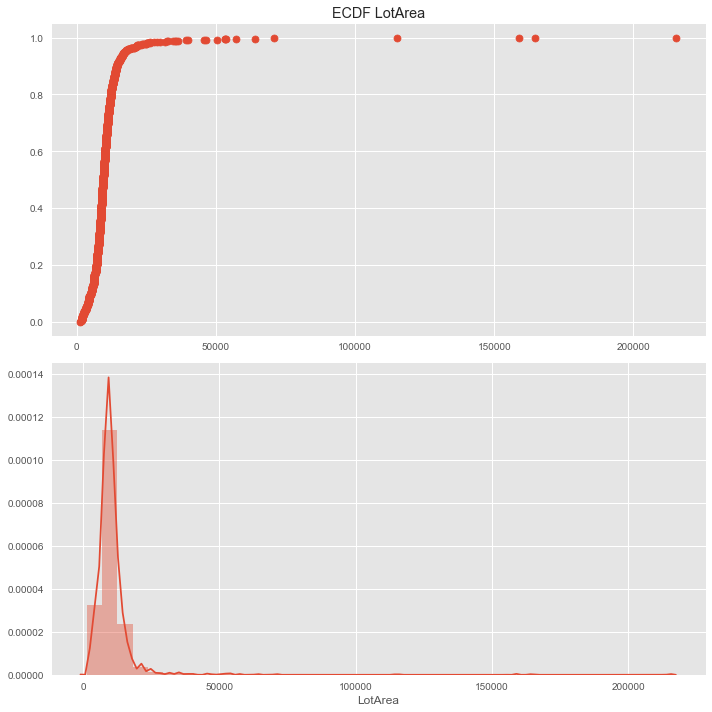

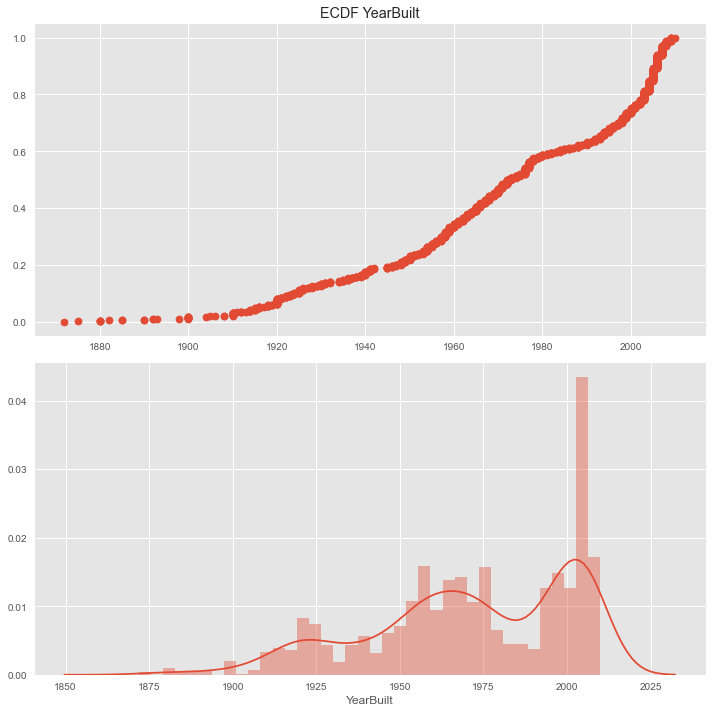

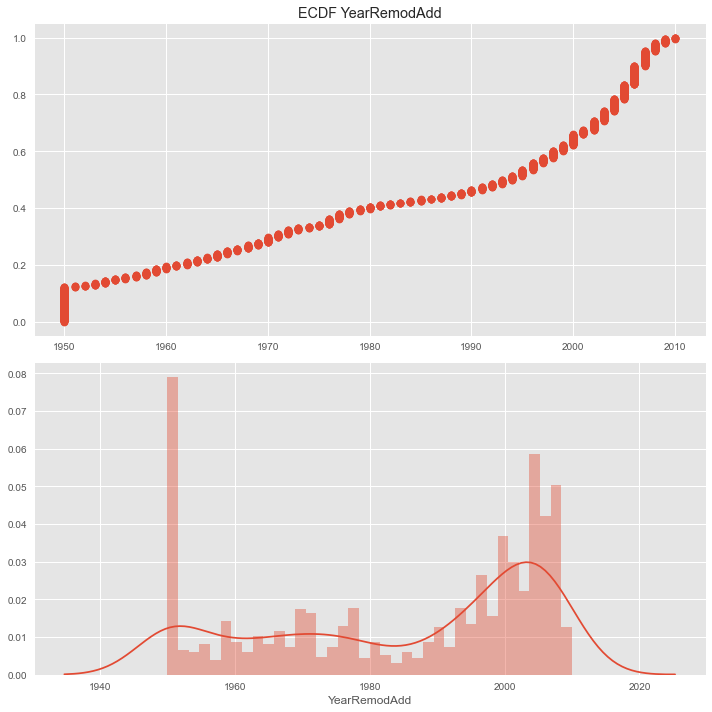

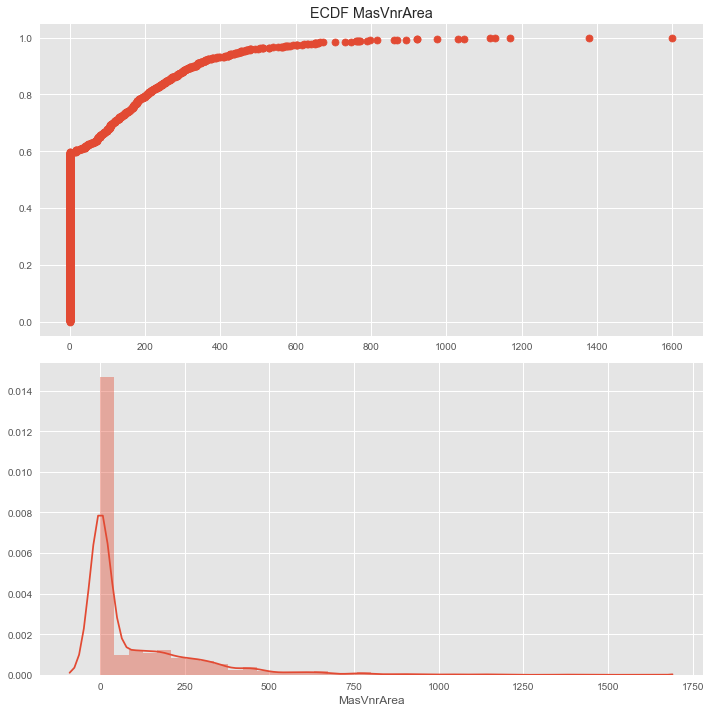

...

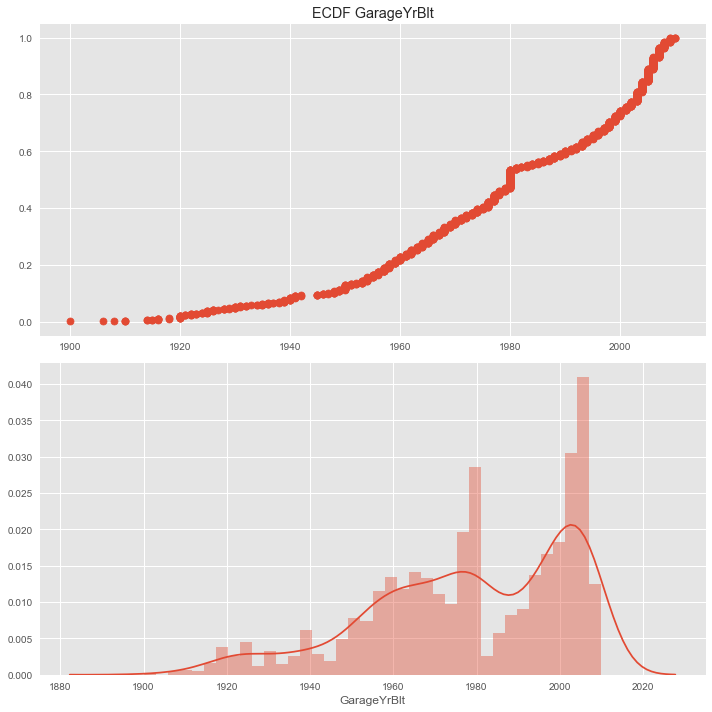

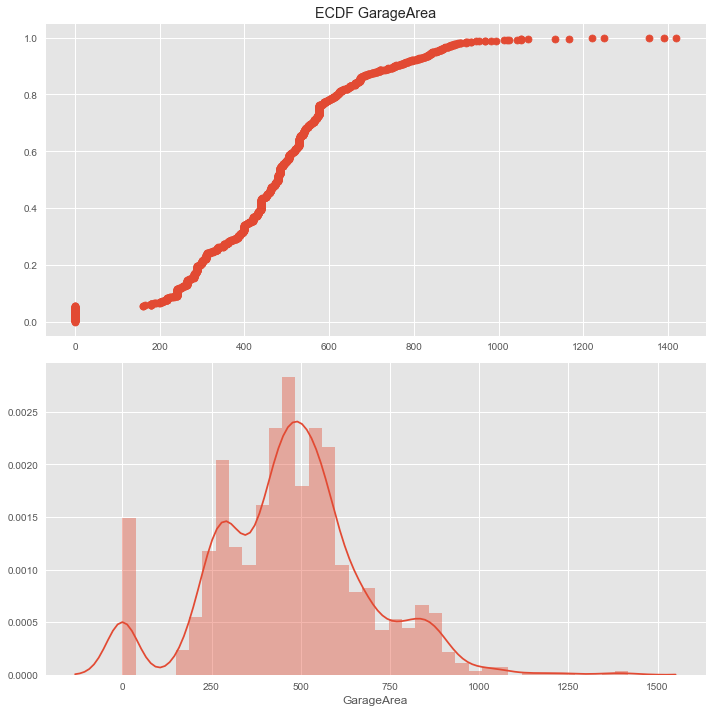

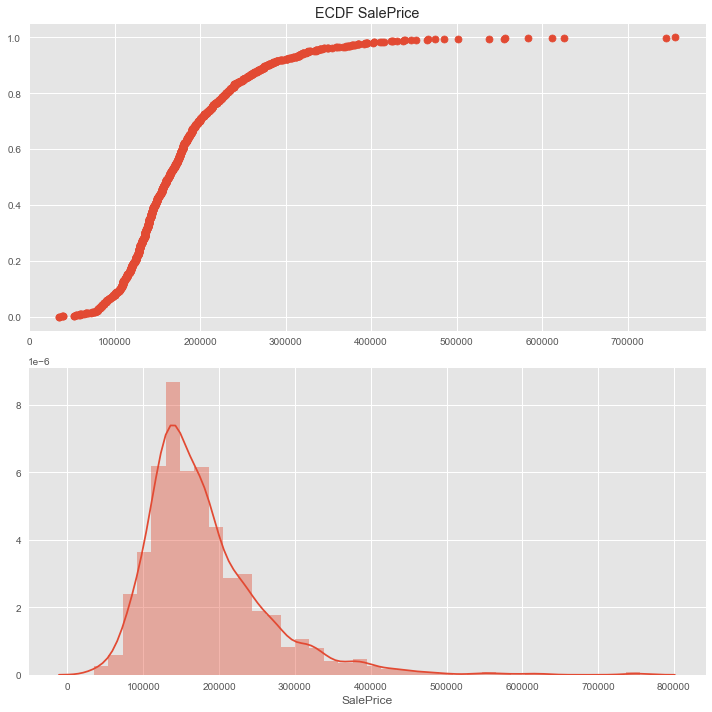

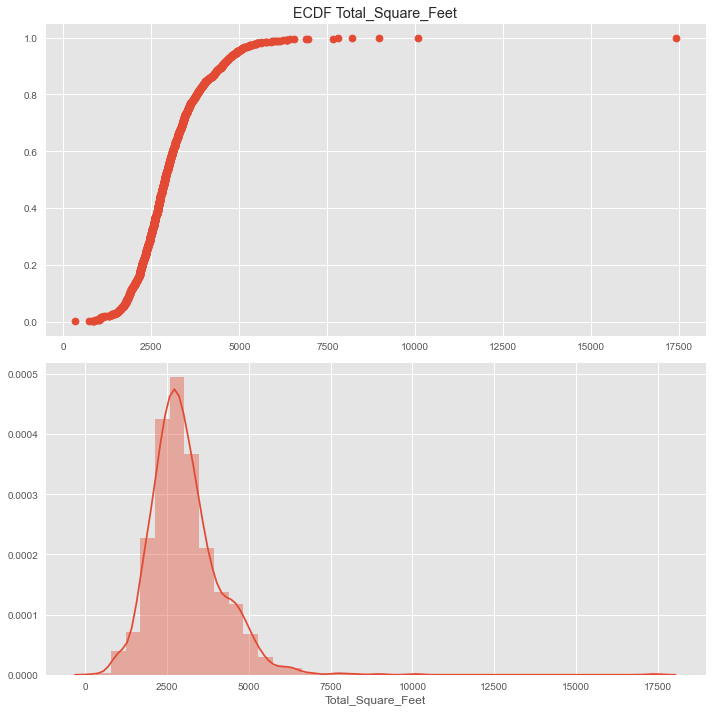

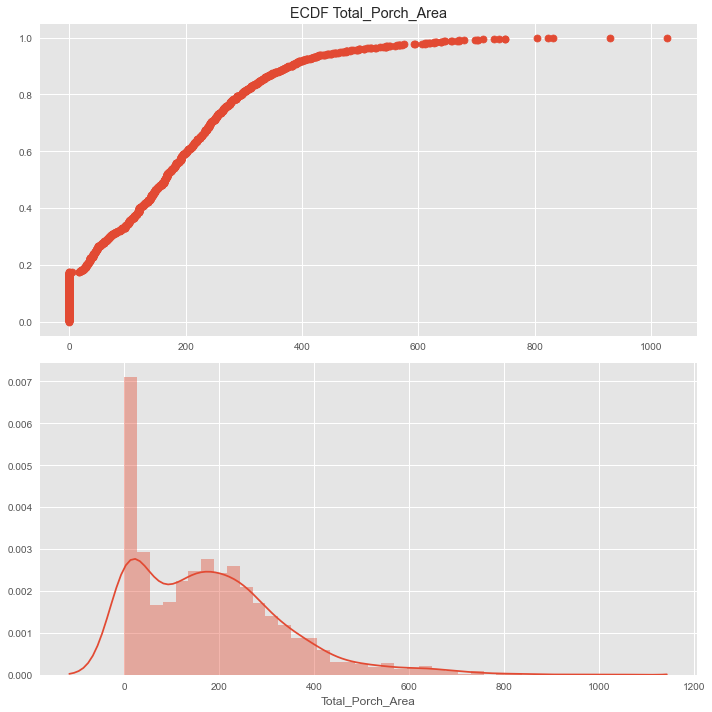

In [33]:
#Numerics
plt.rcParams['font.size']=10
for col in df[num_vars].drop('Id', axis = 1):
    x, y = ECDF(df[col])
    fig, ax = plt.subplots(2,1, figsize = (10,10))
    ecdf = sns.scatterplot(x,y, edgecolor = None, ax = ax[0])
    hist = sns.distplot(df[col], bins = int(np.floor(np.sqrt(len(df[col])))),norm_hist= True, ax = ax[1])
    ecdf.set_title('ECDF ' + col)
    plt.tight_layout()
    plt.show()

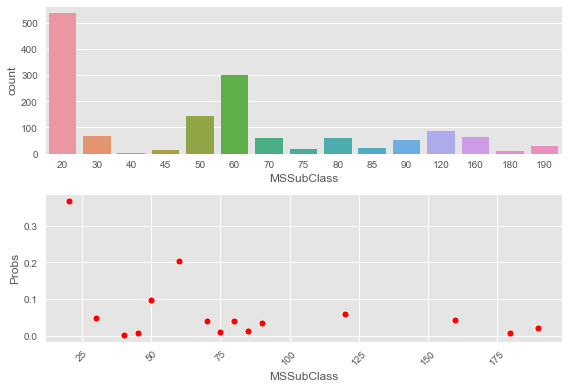

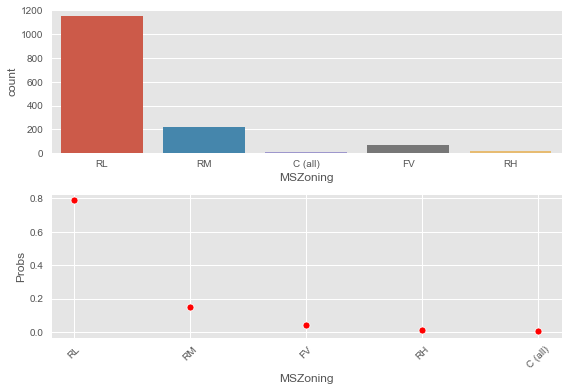

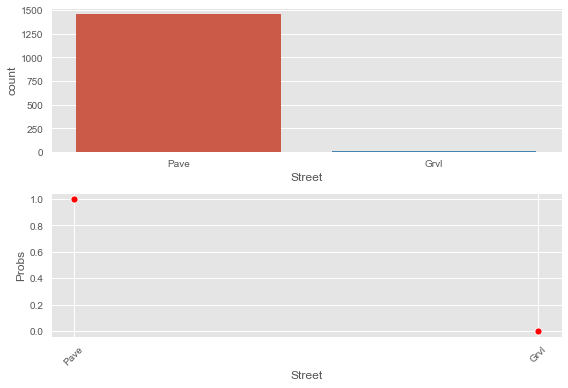

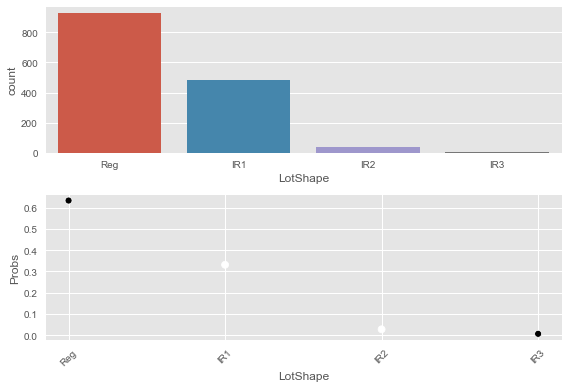

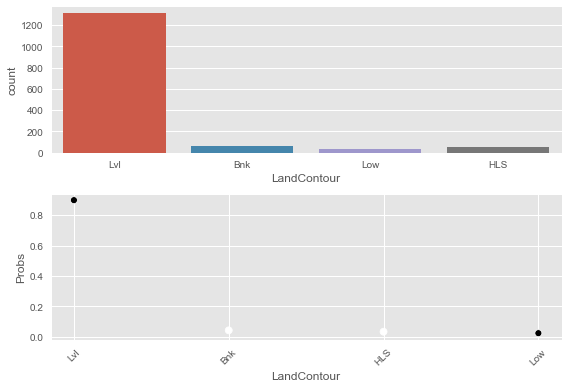

...

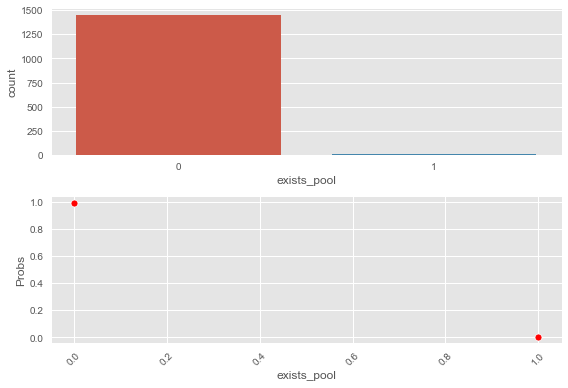

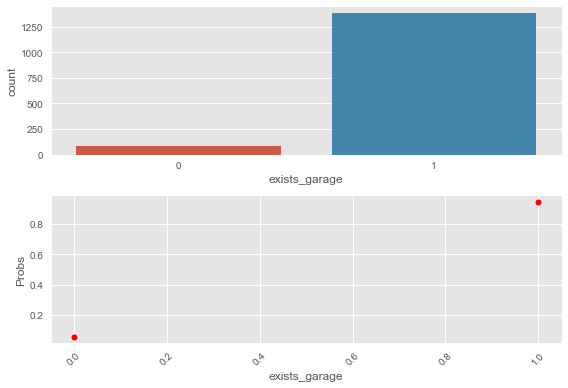

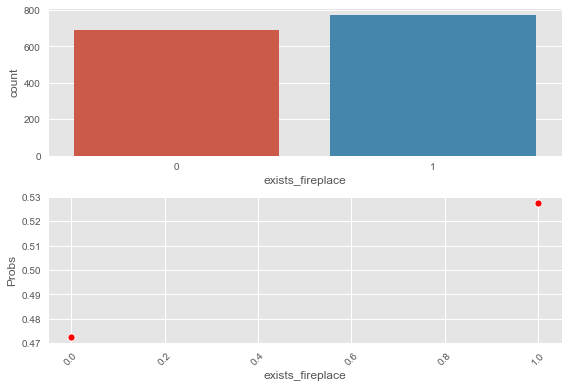

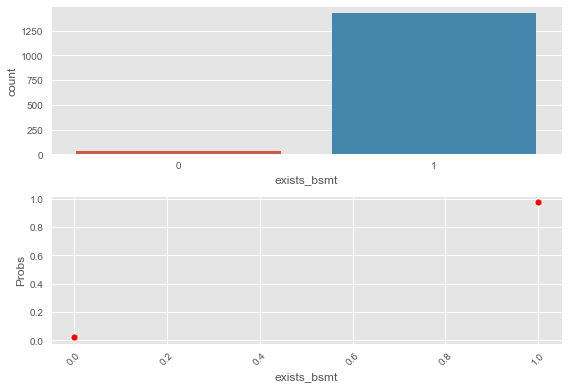

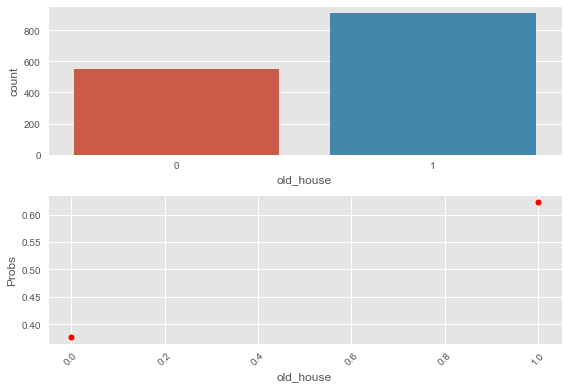

In [63]:
#Categorical
for col, name in zip(df[cat_vars], df[cat_vars].columns.tolist()):
    Pmf = df[col].value_counts(normalize = True).to_frame().reset_index()\
                .rename(columns = {'index': name, name:'Probs'})
    
    fig, ax  = plt.subplots(2,1)
    sns.countplot(df[col] ,ax = ax[0])
    sns.scatterplot(x =Pmf[name] , y= Pmf.Probs ,ax = ax[1], color = 'red')
    plt.xticks(rotation = 45)
    plt.tight_layout()
    plt.show()

##### We find some variables which more than 80% fall to 0. Some of them make sense to transform them to binary.

### Bivariate analysis with the variable that we seek to predict(SalePrice)

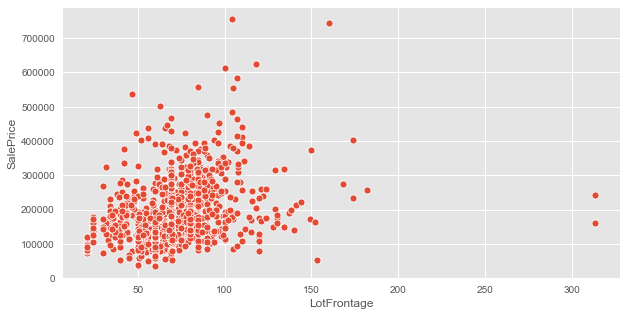

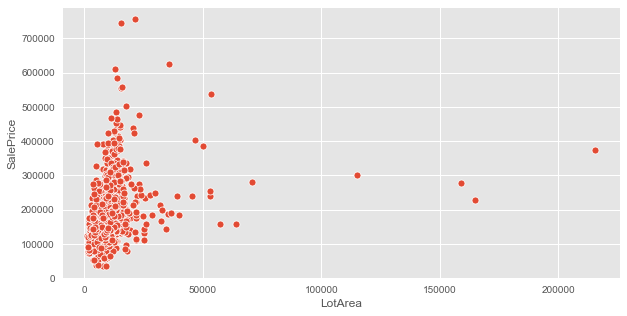

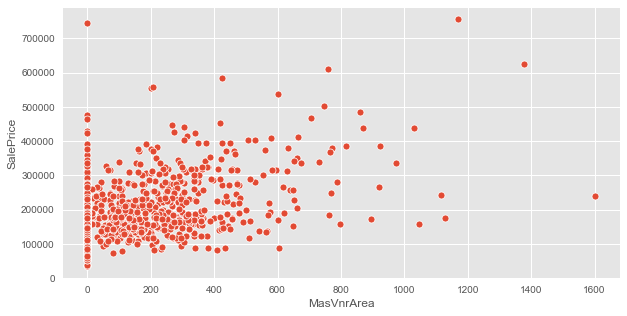

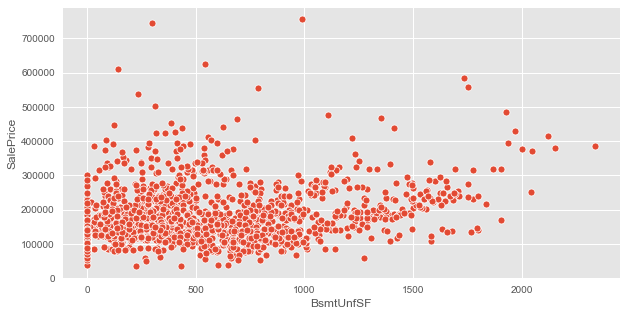

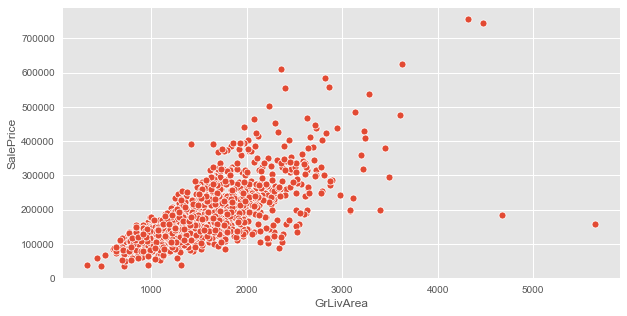

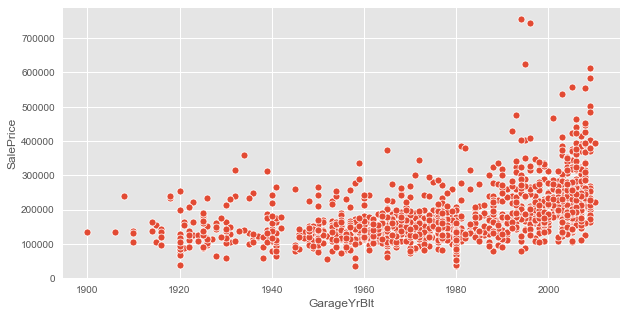

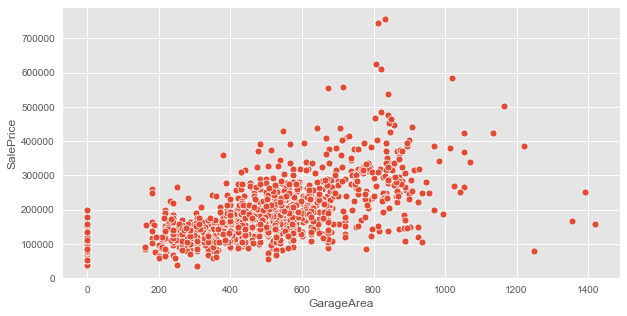

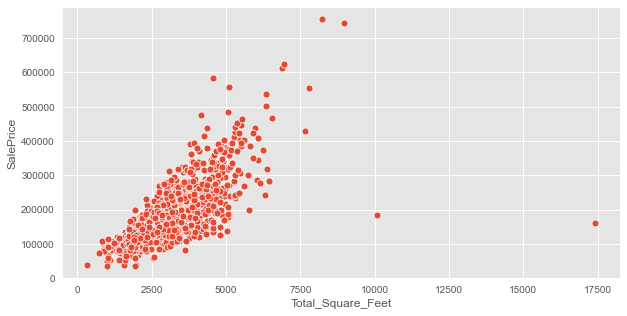

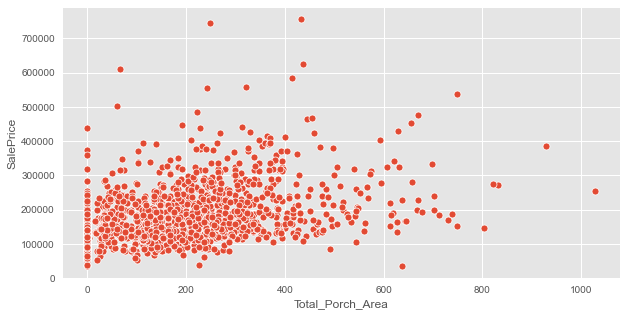

In [34]:
to_drop = ['Id', 'YearBuilt', 'YearRemodAdd', 'SalePrice']
for col in df[num_vars].drop(to_drop, axis = 1).columns:
    plt.figure(figsize = (10,5))
    sns.scatterplot(x = df[col], y = df.SalePrice)
    plt.show()


Years

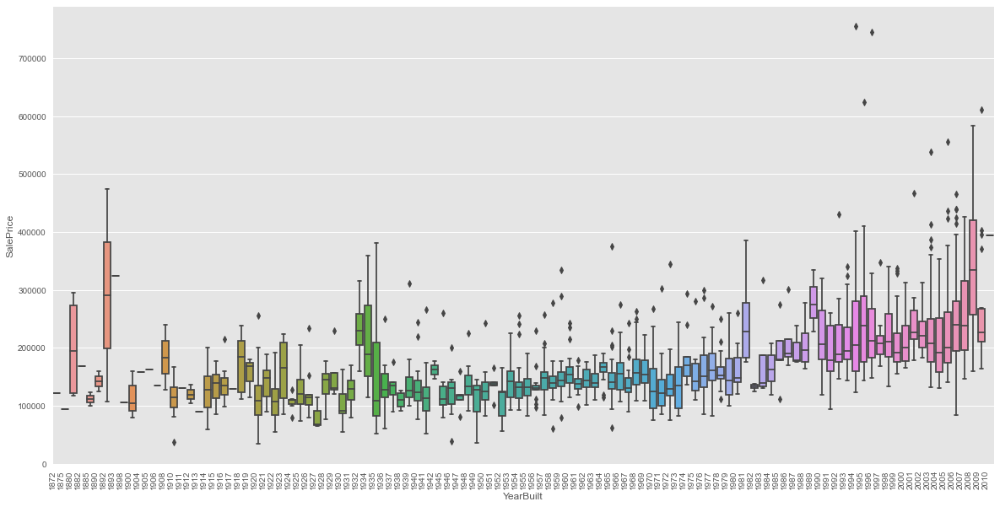

In [35]:
plt.figure(figsize = (20,10))
plt.rcParams['font.size']=10
sns.boxplot(df.YearBuilt, df.SalePrice)
plt.xticks(rotation=90, horizontalalignment='right')
plt.show()

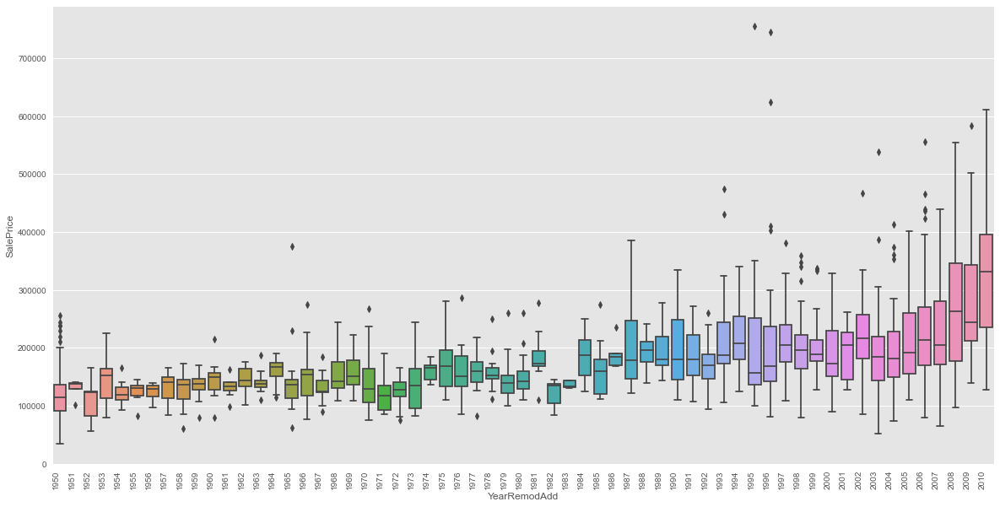

In [36]:
plt.figure(figsize = (20,10))
sns.boxplot(df.YearRemodAdd, df.SalePrice)
plt.xticks(rotation=90, horizontalalignment='right')
plt.show()

Correlation: YearRemodAdd, YearBuilt =  0.5928549763436497


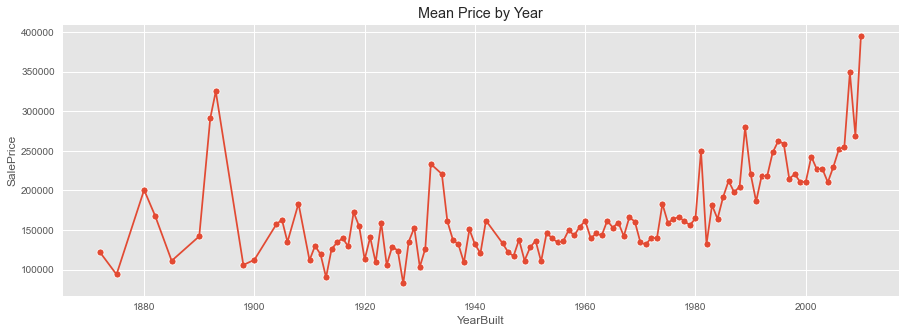

In [37]:
print('Correlation: YearRemodAdd, YearBuilt = ',df.corr().loc['YearRemodAdd','YearBuilt'])
mean_yearblt = df.groupby('YearBuilt')[['SalePrice']].mean().reset_index()
plt.figure(figsize=(15,5))
sns.lineplot(x = mean_yearblt.YearBuilt,y = mean_yearblt.SalePrice)
sns.scatterplot(x = mean_yearblt.YearBuilt,y = mean_yearblt.SalePrice)
plt.title('Mean Price by Year')
plt.show()

Categorical

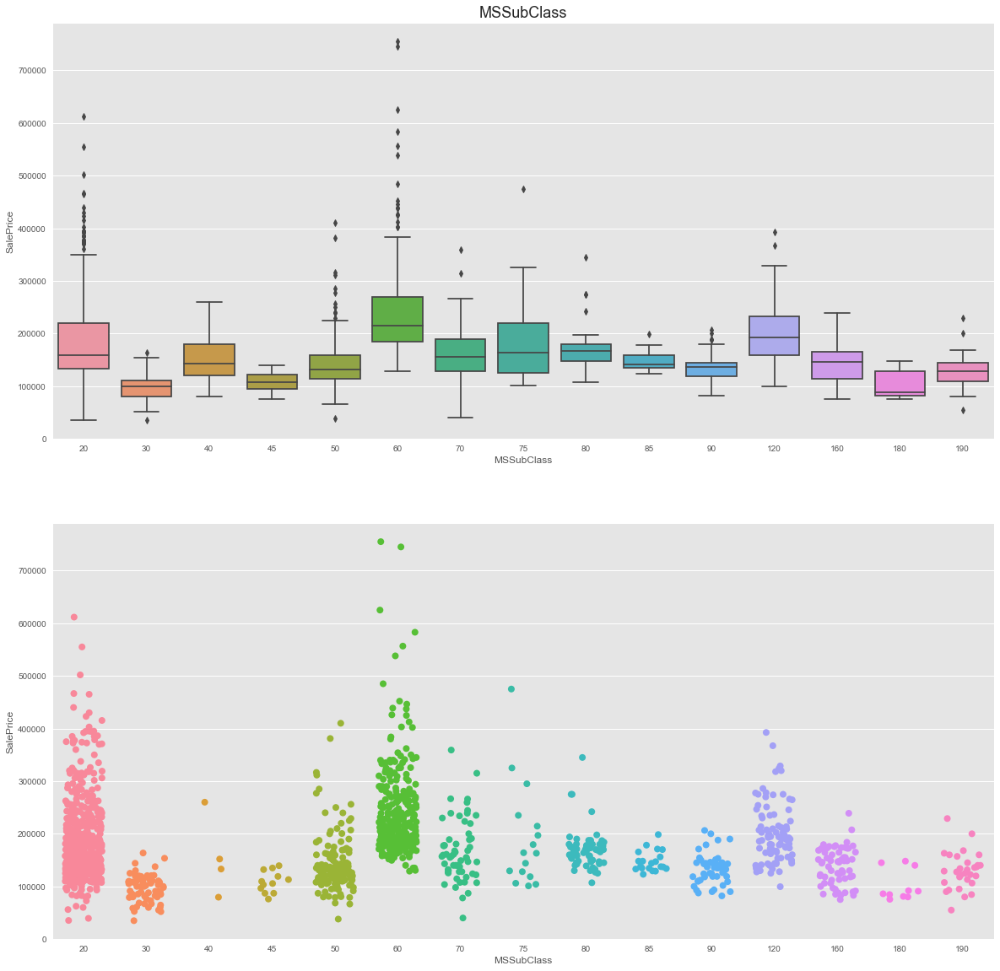

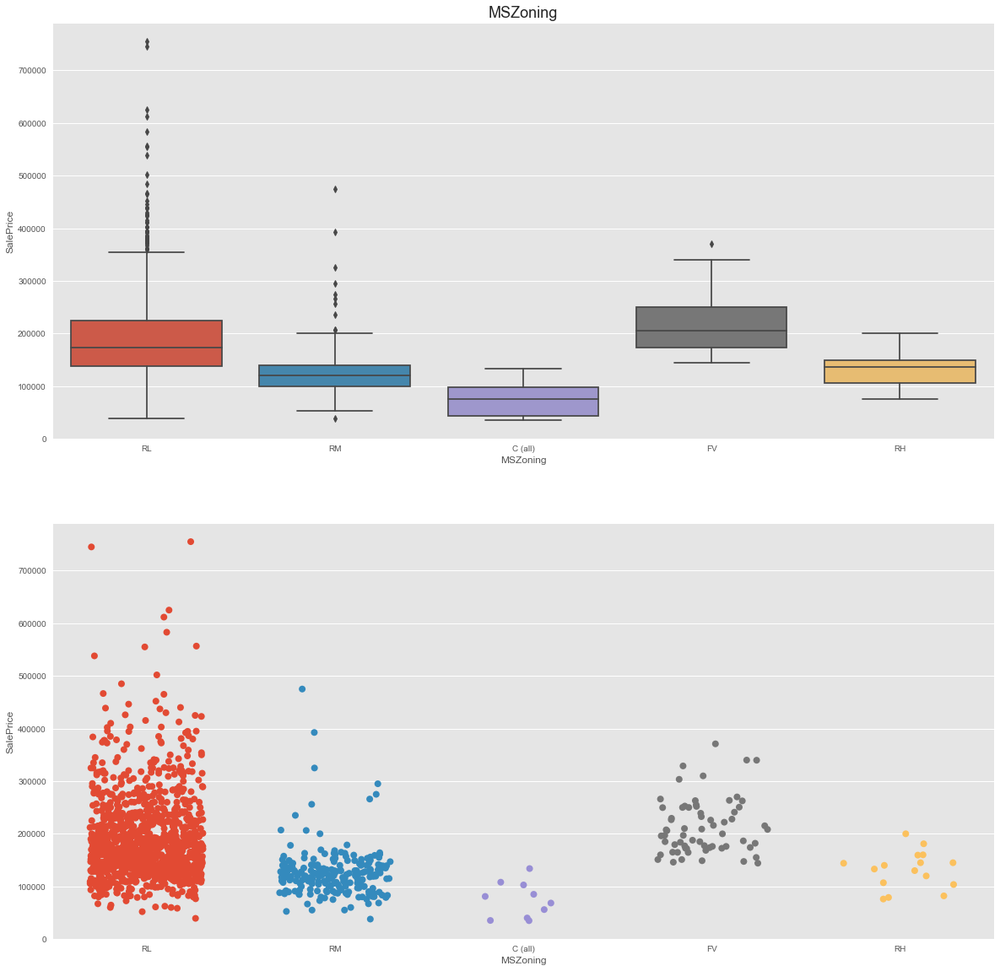

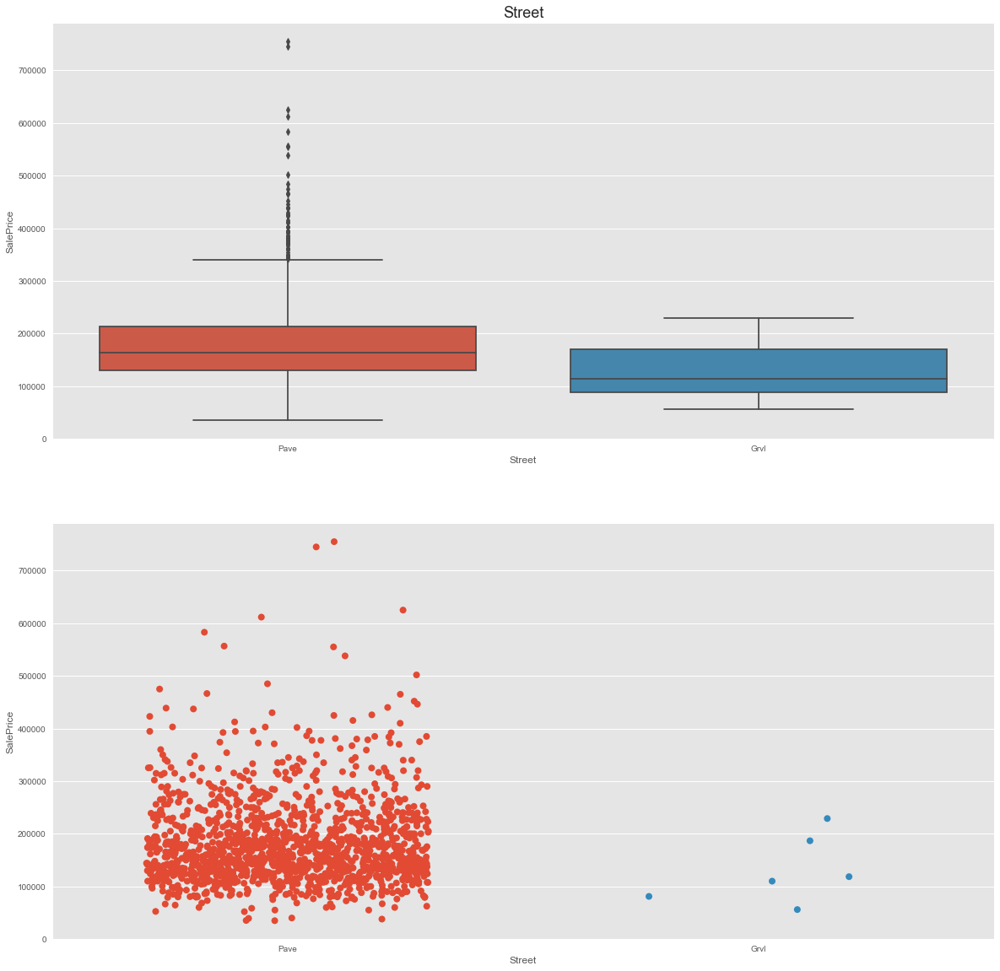

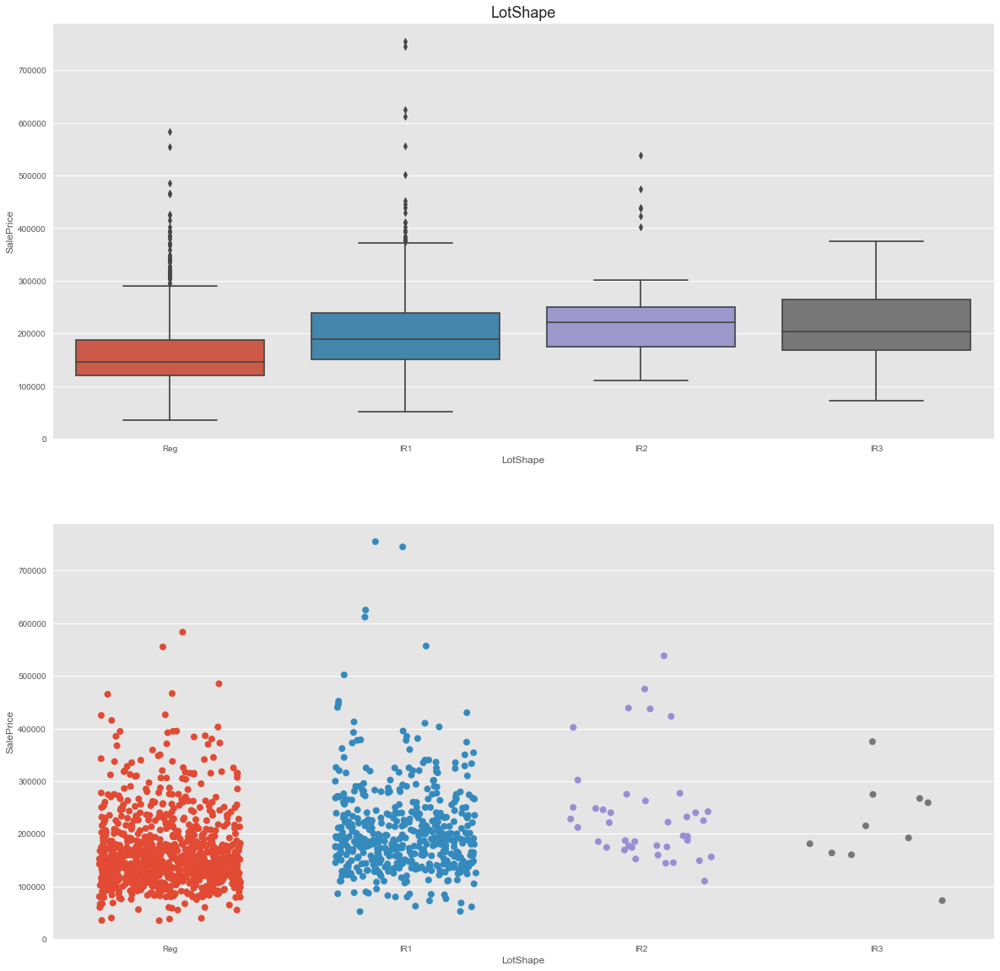

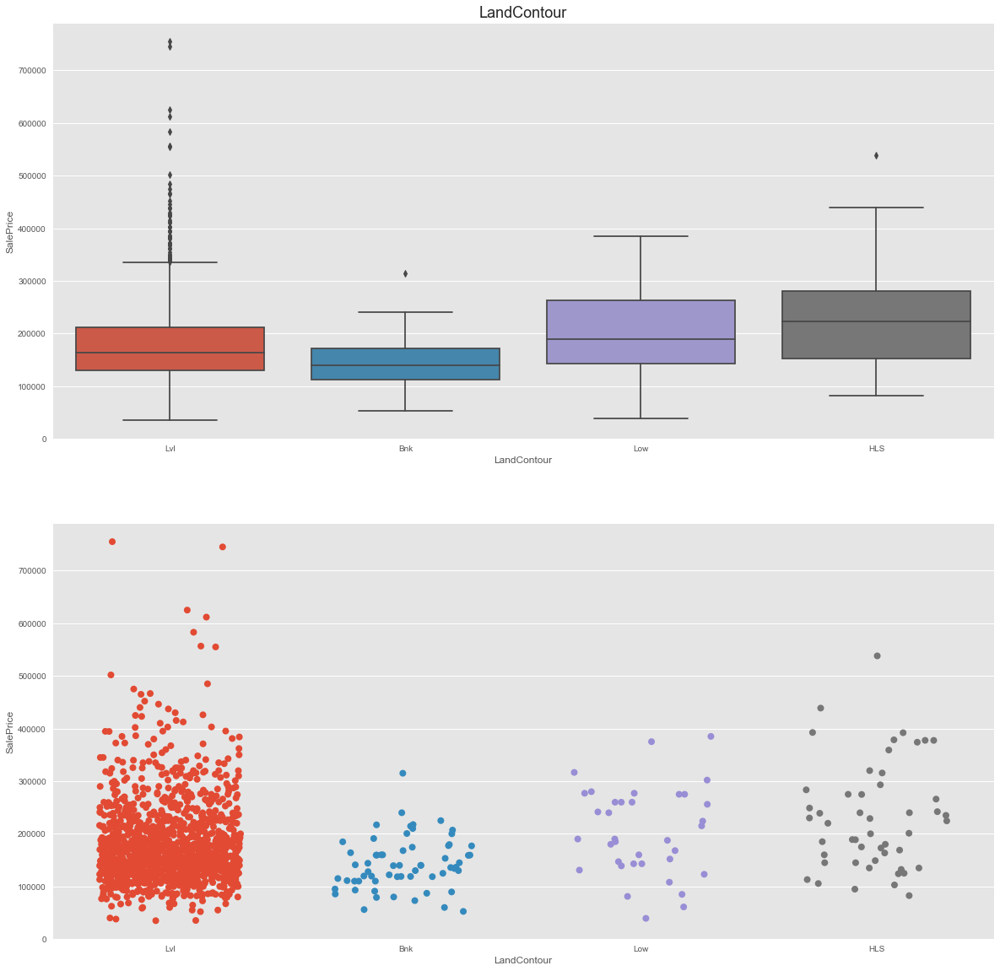

...

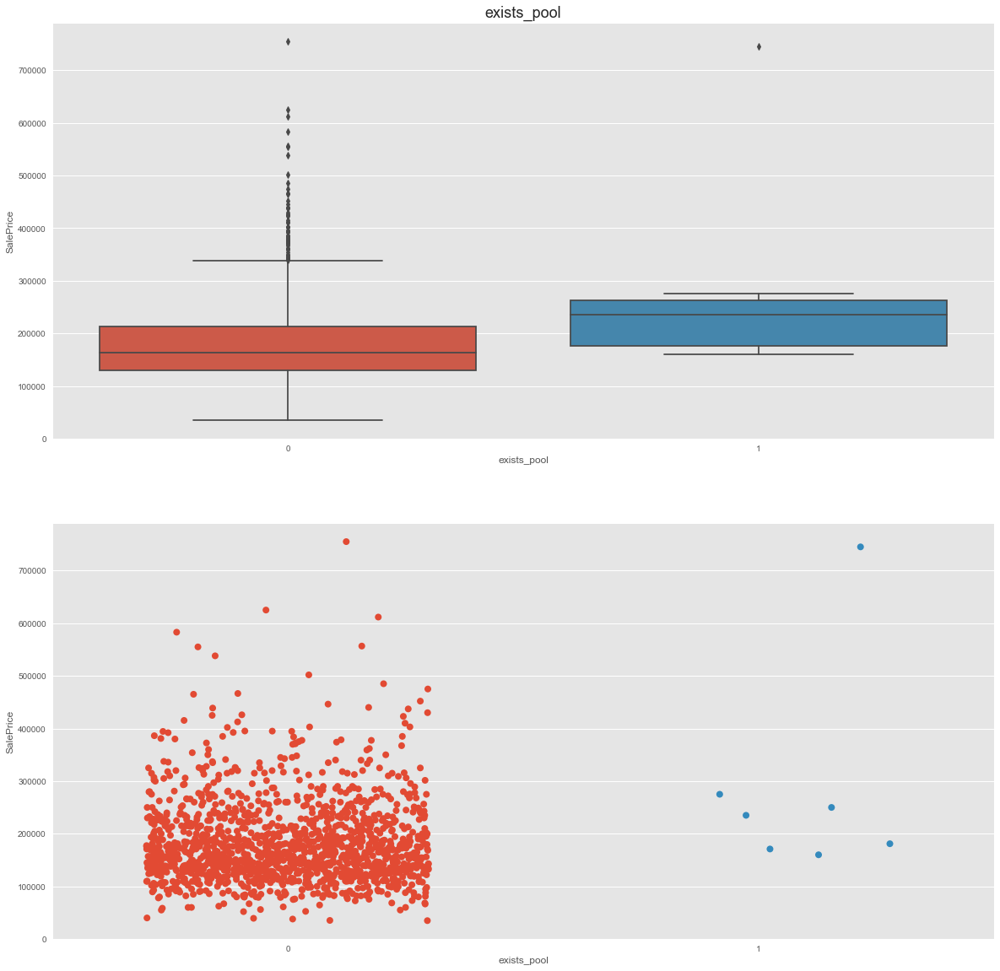

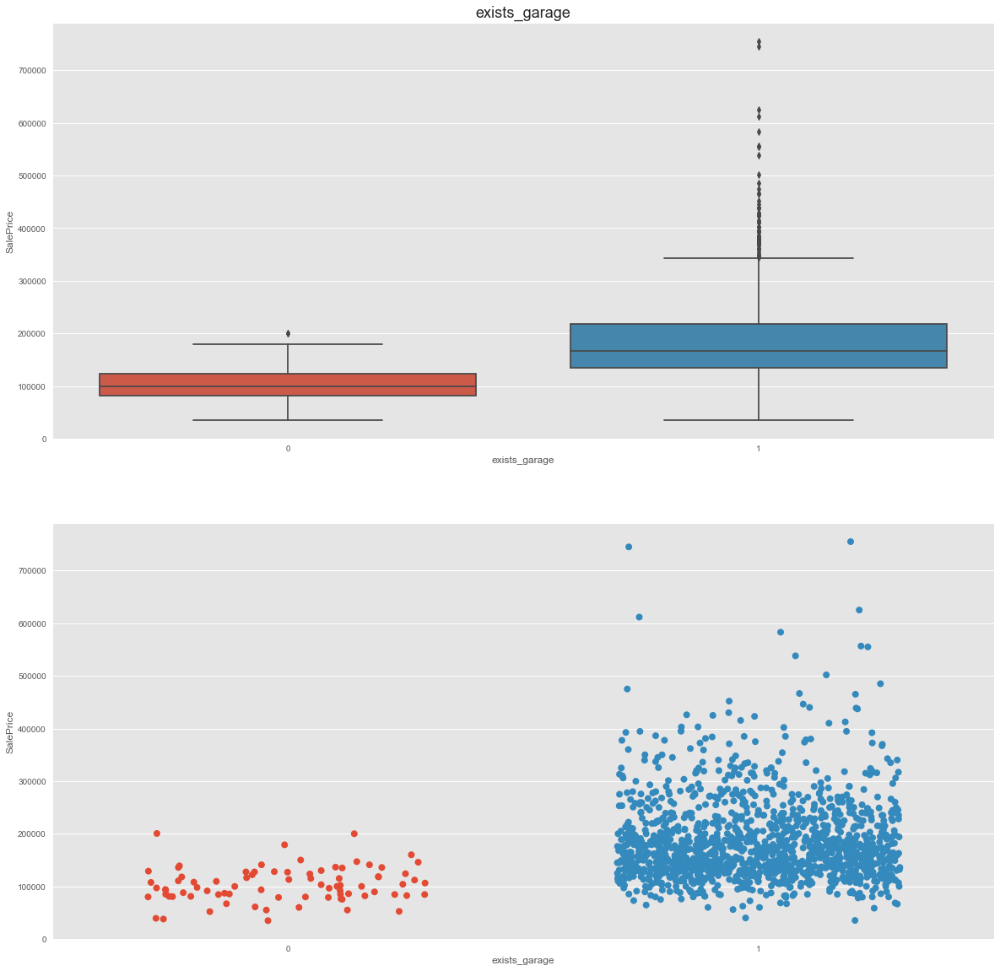

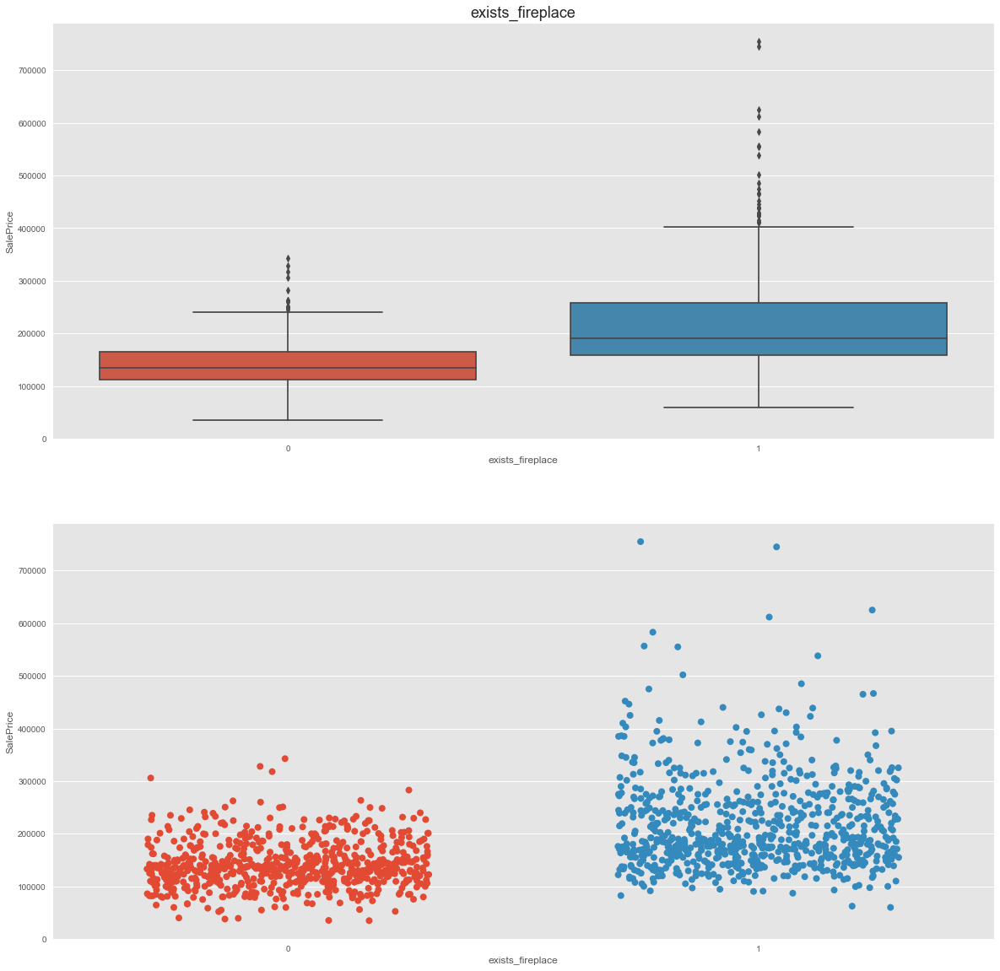

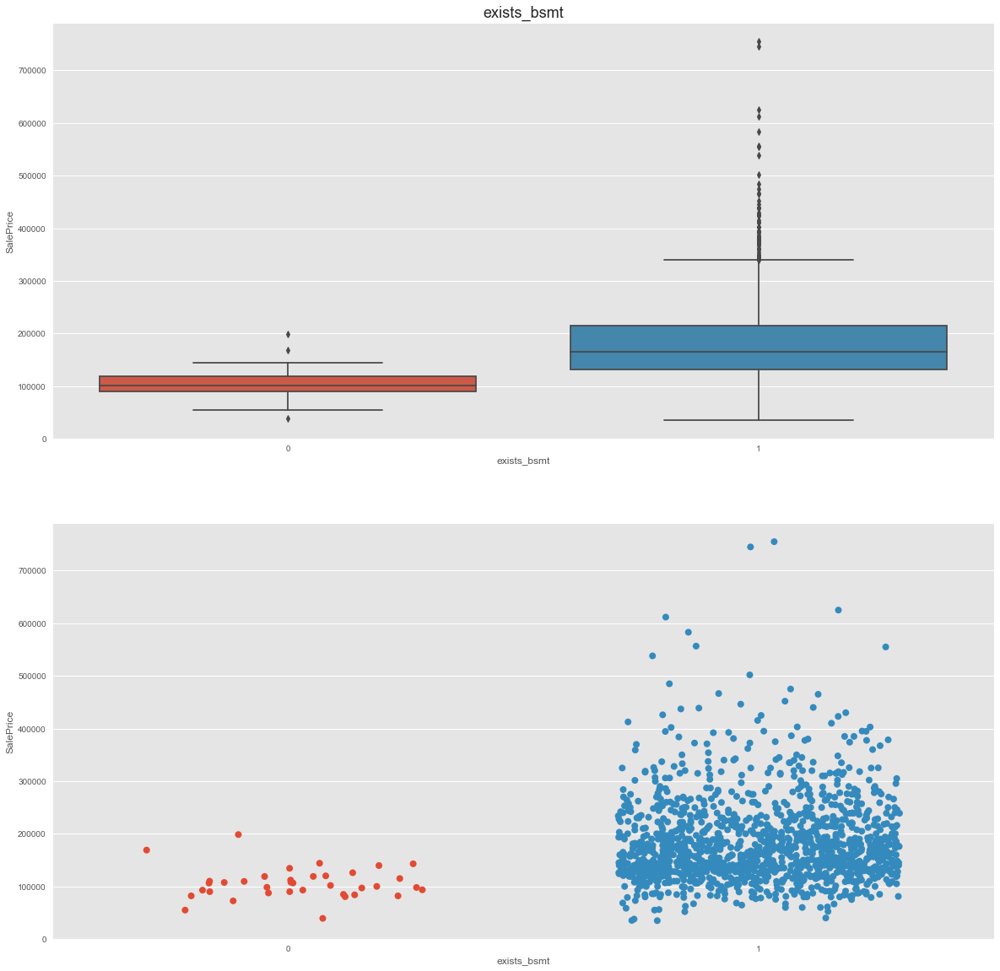

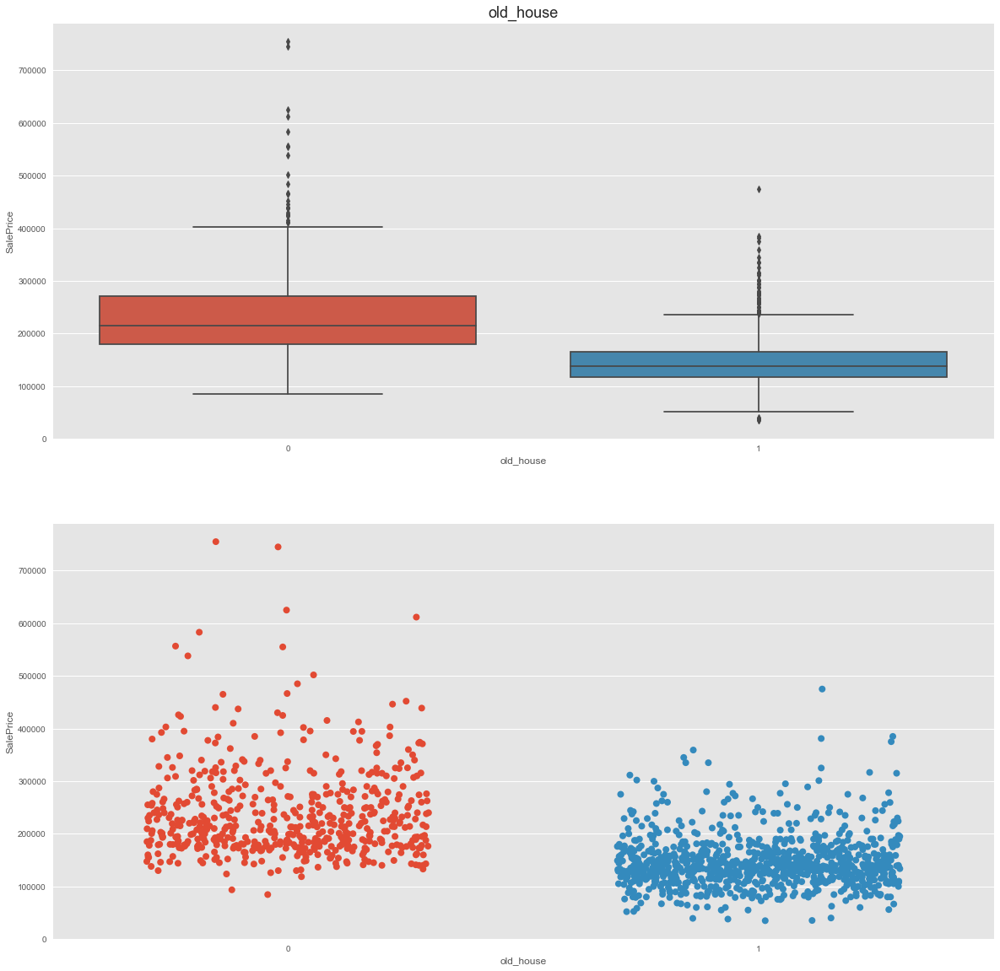

In [35]:
for col in df[cat_vars].columns:    
    fig, ax = plt.subplots(2,1,figsize = (20,20))
    box = sns.boxplot(x = df[col], y = df.SalePrice, ax = ax[0])
    jitter = sns.stripplot(df[col], df.SalePrice, jitter = 0.3, ax = ax[1], s=8)
    box.set_title(col, fontsize = 18)
#     box.set_xticklabels(box.get_xticklabels(), rotation=45)
    plt.show()

## Feature Enginner 2

In [39]:
[df[col].value_counts(normalize =True).head(10) for col in df[cat_vars].columns]

[20     0.367123
 60     0.204795
 50     0.098630
 120    0.059589
 30     0.047260
 160    0.043151
 70     0.041096
 80     0.039726
 90     0.035616
 190    0.020548
 Name: MSSubClass, dtype: float64,
 RL         0.788356
 RM         0.149315
 FV         0.044521
 RH         0.010959
 C (all)    0.006849
 Name: MSZoning, dtype: float64,
 Pave    0.99589
 Grvl    0.00411
 Name: Street, dtype: float64,
 Reg    0.633562
 IR1    0.331507
 IR2    0.028082
 IR3    0.006849
 Name: LotShape, dtype: float64,
 Lvl    0.897945
 Bnk    0.043151
 HLS    0.034247
 Low    0.024658
 Name: LandContour, dtype: float64,
 AllPub    0.999315
 NoSeWa    0.000685
 Name: Utilities, dtype: float64,
 Inside     0.720548
 Corner     0.180137
 CulDSac    0.064384
 FR2        0.032192
 FR3        0.002740
 Name: LotConfig, dtype: float64,
 Gtl    0.946575
 Mod    0.044521
 Sev    0.008904
 Name: LandSlope, dtype: float64,
 NAmes      0.154110
 CollgCr    0.102740
 OldTown    0.077397
 Edwards    0.068493
 Some

Drop

In [64]:
# We get rid of variables which more than 80% fall in a value and the rest of the classes do not exceed 6%,
# with the expection of SaleCondition
unbalance_vars  = ['Street', 'LandContour', 'Utilities', 'LandSlope', 'Condition2',\
                   'BsmtCond', 'LowQualFinSF']
df.drop(unbalance_vars, axis = 1, inplace = True)

### Categóricas

to_binary

In [65]:
# to_binary = ['Condition1', 'Heating', 'Electrical', 'Functional']
# for col in df[to_binary].columns:
#     print(df[col].value_counts())

# df['Condition1'] = df.Condition1.apply(lambda val : 1 if val == 'Norm' else 0)
# df['Heating'] = df.Heating.apply(lambda val : 1 if val == 'GasA' else 0)
# df['Electrical'] = df.Electrical.apply(lambda val: 1 if val == 'SBrkr' else 0)
# df['Functional'] = df.Functional.apply(lambda val: 1 if val == 'Typ' else 0)

Class collapse

In [66]:
# rc = ['HouseStyle', 'GarageQual', 'Exterior1st',\
#       'RoofStyle', 'SaleType','SaleCondition']
# for col in df[rc].columns:
#     print(df[col].value_counts())

In [67]:

# df.HouseStyle = pycats.cat_other(df.HouseStyle, ['1.5Unf', '2.5Unf', '2.5Fin'], other_level='Others')
# df.Exterior1st = pycats.cat_other(df.Exterior1st, ['Stone', 'BrkComm', 'CBlock', 'AsphShn',\
#                     'ImStucc', 'BrkFace', 'WdShing','Stucco'], other_level= 'Others')
# df.RoofStyle = pycats.cat_other(df.RoofStyle, ['Flat', 'Gambrel', 'Mansard', 'Shed'], other_level='Others')
# df.SaleType = pycats.cat_other(df.SaleType, ['ConLD', 'ConLI', 'ConLw', 'CWD', 'Oth', 'Con'],other_level='Others')
# df.SaleCondition = pycats.cat_other(df.SaleCondition,['Family', 'Alloca', 'AdjLand'], other_level='Others')

# for col in df[rc].columns:
# #     print(df1[col].value_counts())
#     df[col] = df[col].astype('str')

### Outliers

In [68]:
#remove outliers df1 and df 
Q1 = df1.drop('Id', axis = 1).quantile(0.25) 
Q3 = df1.drop('Id', axis = 1).quantile(0.75) 
IQR = Q3 - Q1 

df1_out = df1[~ ((df1 < (Q1 - 2 * IQR)) | (df1 > (Q3 + 2 * IQR))).any(axis = 1)]
df1.shape, df1_out.shape

((1460, 68), (1051, 68))

In [69]:
Q1 = df.drop('Id', axis = 1).quantile(0.25) 
Q3 = df.drop('Id', axis = 1).quantile(0.75) 
IQR = Q3 - Q1 

df_out = df[~ ((df < (Q1 - 2 * IQR)) | (df > (Q3 + 2 * IQR))).any(axis = 1)]
df.shape, df_out.shape

((1460, 64), (1064, 64))

In [70]:
print('Outliers percent : ',(((df < (Q1 - 2 * IQR)) | (df > (Q3 + 2 * IQR))).any(axis = 1).mean())*100,'%')

Outliers percent :  27.123287671232877 %


In [71]:
# VIF
x = add_constant(df_out.drop('SalePrice',axis=1)[df_out.drop('SalePrice',axis=1).describe().columns])
vif = pd.Series([variance_inflation_factor(x.values , i) 
               for i in range(x.shape[1])], 
              index = x.columns)[1:]
vif[vif > 3]

C:\Users\azaze\Anaconda2\envs\myenv\lib\site-packages\statsmodels\regression\linear_model.py:1685: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Users\azaze\Anaconda2\envs\myenv\lib\site-packages\statsmodels\regression\linear_model.py:1685: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


OverallQual          3.119264
YearBuilt            6.547653
GrLivArea            6.680097
TotRmsAbvGrd         3.954294
Fireplaces           6.627140
GarageYrBlt          5.405982
GarageCars           4.066945
GarageArea           3.936312
Total_Square_Feet    3.535409
Total_Bath           3.120750
exists_fireplace     6.571774
old_house            5.640006
dtype: float64

In [72]:
good_vars = vif[vif >= 2].keys().tolist()
good_vars

['MSSubClass',
 'LotArea',
 'OverallQual',
 'YearBuilt',
 'YearRemodAdd',
 'GrLivArea',
 'BedroomAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageYrBlt',
 'GarageCars',
 'GarageArea',
 'Total_Square_Feet',
 'Total_Bath',
 'exists_fireplace',
 'old_house']

********************************************************************************************************

## Machine Learning

In [74]:
y = np.log(df_out.SalePrice)
X = df_out.drop(['SalePrice','Id'], axis = 1)
# X = df_out[good_vars]

In [75]:
num_vars, cat_vars = [], []
for col in X.columns:

    if X[col].nunique() > 25:
        num_vars.append(col)
    else:
        cat_vars.append(col)

In [76]:
X = pd.get_dummies(X, columns= cat_vars, drop_first= True)
X[num_vars] =  StandardScaler().fit_transform(X[num_vars])
print(X.shape)

X_train, X_test, Y_train, Y_test = train_test_split(X, y, test_size = 0.2, random_state = 123)

(1064, 249)


**********************************************************************************************************

### LassoCV

In [77]:
lasso = linear_model.LassoCV(alphas = [1e-3, 1e-2, 1e-1, 1], cv=10).fit(X_train, Y_train)
y_hat = lasso.predict(X_test)
R2_lasso = metrics.r2_score(Y_test, y_hat) 
RMSE_lasso = np.sqrt(metrics.mean_squared_error(Y_test, y_hat))

print('R2' ,R2_lasso)
print('RMSE', RMSE_lasso)

R2 0.9065940001822426
RMSE 0.09634317443338403


### RidgeCV

In [78]:
ridgeCV = linear_model.RidgeCV(alphas = [1e-3, 1e-2, 1e-1, 1], cv=10).fit(X_train, Y_train)
y_hat = ridgeCV.predict(X_test)
R2_ridge = metrics.r2_score(Y_test, y_hat) 
RMSE_ridge = np.sqrt(metrics.mean_squared_error(Y_test, y_hat))

print('R2_ridge:', R2_ridge)
print('RMSE_ridge:', RMSE_ridge)

R2_ridge: 0.9079905042084788
RMSE_ridge: 0.09562025345798157


### XGBOOST

In [79]:
DMatrix = xgb.DMatrix(X,y)

In [92]:
DM_train = xgb.DMatrix(X_train, Y_train)
DM_test =  xgb.DMatrix(X_test, Y_test)

params = {'booster':'gbtree', 'objective':'reg:squarederror', 'lambda' : 0.5}

xg_reg = xgb.train(params = params, dtrain = DM_train, num_boost_round = 2000)
preds = xg_reg.predict(DM_test)
R2_xgb = metrics.r2_score(Y_test, preds)
RMSE_xgb = np.sqrt(metrics.mean_squared_error(Y_test,preds))
print('R2', R2_xgb)
print('RMSE:',RMSE_xgb)

R2 0.871080142138207
RMSE: 0.11318619857925685


In [59]:
# ETA optimization
params = {"objective":"reg:squarederror",'booster':'gbtree'}

eta_vals = [0.001, 0.01, 0.1, 0.002, 0.02, 0.2, 0.003, 0.03, 0.3]
best_rmse = []

for curr_val in eta_vals:

    params["eta"] = curr_val
    
    cv_results = xgb.cv(dtrain= DMatrix, params= params, nfold= 5,
                        num_boost_round= 2000, early_stopping_rounds= 5,
                        metrics= "rmse", as_pandas= True, seed= 123)
    
    best_rmse.append(cv_results["test-rmse-mean"].tail().values[-1])

print(pd.DataFrame(list(zip(eta_vals, best_rmse)), columns=["eta","best_rmse"]))

     eta  best_rmse
0  0.001   1.580478
1  0.010   0.120905
2  0.100   0.120868
3  0.002   0.257689
4  0.020   0.119632
5  0.200   0.123770
6  0.003   0.129188
7  0.030   0.120840
8  0.300   0.134907


Grid Search and Random Search

In [95]:
%%time
#Random Seacrh
gbm_param_grid = {
    'colsample_bytree': np.arange(0.5, 1 ,0.1),
    'n_estimators': np.arange(500,3000,100),
    'max_depth': np.arange(2,15,1),
    'learning_rate': [0.01, 0.1, 0.001],
    'alpha': np.arange(0, 1, 0.1)
  }

gbm = xgb.XGBRegressor()

randomized_mse = RandomizedSearchCV(estimator = gbm, param_distributions=gbm_param_grid,
scoring = 'neg_mean_squared_error', verbose = 1, n_iter = 50, cv = 5, n_jobs= -1)

randomized_mse.fit(X, y)
print("Best parameters found: ", randomized_mse.best_params_)
print("Lowest RMSE found: ", np.sqrt(np.abs(randomized_mse.best_score_)))

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed: 10.0min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed: 13.2min finished


Best parameters found:  {'n_estimators': 2900, 'max_depth': 2, 'learning_rate': 0.1, 'colsample_bytree': 0.6, 'alpha': 0.2}
Lowest RMSE found:  0.11048970621974019
Wall time: 13min 21s


In [58]:
#Best parameters found:  {'n_estimators': 2400, 'max_depth': 2, 'learning_rate': 0.1, 'colsample_bytree': 0.7, 'alpha': 0.4000000000000001}
# Lowest RMSE found:  0.10950414313838581

In [96]:
%%time
#Grid Search
gbm_param_grid = {
    'colsample_bytree': [0.7, 0.8, 0.9],
    'n_estimators': [800, 2000, 2500],
    'max_depth': [2, 3, 6, 9],
    'learning_rate': [0.1,0.01],
    'alpha': [0.4,0.6]
}

gbm = xgb.XGBRegressor()
grid_mse = GridSearchCV(estimator= gbm, param_grid= gbm_param_grid, scoring= 'neg_mean_squared_error',
                        cv= 5, verbose=1, n_jobs = -1)

grid_mse.fit(X,y)
print("Best parameters found: ", grid_mse.best_params_)
print("Lowest RMSE found: ", np.sqrt(np.abs(grid_mse.best_score_)))

Fitting 5 folds for each of 144 candidates, totalling 720 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed: 23.9min
[Parallel(n_jobs=-1)]: Done 720 out of 720 | elapsed: 42.8min finished


Best parameters found:  {'alpha': 0.4, 'colsample_bytree': 0.7, 'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 2000}
Lowest RMSE found:  0.10950414313838581
Wall time: 42min 54s


In [97]:
# Best parameters found:  {'alpha': 0.4, 'colsample_bytree': 0.7, 'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 2000}

In [99]:
xgb_rand = grid_mse.best_estimator_
xgb_rand.fit(X_train, Y_train)
y_hat = xgb_rand.predict(X_test)
R2_xgb = metrics.r2_score(Y_test, y_hat)
RMSE_xgb = np.sqrt(metrics.mean_squared_error(Y_test, y_hat))

In [62]:
%%time
params = {'objective' : 'reg:squarederror', 'max_depth' : 4, 'alpha':0.001, 'eta': 0.03,
          'colsample_bytree': 0.3}

cv_results = xgb.cv(dtrain= DMatrix, params= params, nfold= 10, num_boost_round= 5000,
                     metrics= 'rmse', as_pandas= True, seed= 123)
print(cv_results)
print((cv_results["test-rmse-mean"]).tail(1))

      train-rmse-mean  train-rmse-std  test-rmse-mean  test-rmse-std
0           11.190701        0.003602       11.190625       0.033571
1           10.855622        0.003493       10.855545       0.033673
2           10.530593        0.003387       10.530515       0.033772
3           10.215315        0.003284       10.215235       0.033868
4            9.909495        0.003184        9.909414       0.033961
...               ...             ...             ...            ...
4995         0.002470        0.000058        0.112278       0.018676
4996         0.002470        0.000058        0.112278       0.018676
4997         0.002470        0.000058        0.112278       0.018676
4998         0.002470        0.000058        0.112278       0.018676
4999         0.002469        0.000058        0.112278       0.018676

[5000 rows x 4 columns]
4999    0.112278
Name: test-rmse-mean, dtype: float64
Wall time: 2min 8s


### GradientBoostingRegressor

In [102]:
gb_reg = GradientBoostingRegressor(n_estimators=2000, learning_rate=0.03, max_depth=4, 
        max_features='sqrt', min_samples_leaf=15, min_samples_split=20, loss='huber', random_state =42)
gb_reg.fit(X_train, Y_train)
y_hat=gb_reg.predict(X_test)

R2_gbr= metrics.r2_score(Y_test,y_hat)
RMSE_gbr = np.sqrt(metrics.mean_squared_error(Y_test,y_hat))

In [64]:
CV = cross_val_score(gb_reg, X, y, scoring = 'neg_mean_squared_error', cv = 10)

In [65]:
print('Lowest RMSE: ' ,np.sqrt(np.abs(CV)).min())

Lowest RMSE:  0.08640597661578683


Grid Search and Random Search

In [66]:
%%time
#Random Seacrh
gbr_param_grid = {
    'max_features': ['sqrt'],
    'n_estimators': np.arange(500, 2000, 100),
    'max_depth': [3, 6 , 9],
    'learning_rate': np.arange(0.001, 0.1, 0.001),
    'loss' :['huber'],
    'min_samples_leaf' : [9, 12, 15, 16],
    'min_samples_split' : [3, 9, 12, 14, 16]
  }

gbr = GradientBoostingRegressor()

randomized_gbr = RandomizedSearchCV(estimator = gbr, param_distributions = gbr_param_grid,
scoring = 'neg_mean_squared_error', verbose = 1, n_iter = 200, cv = 5, n_jobs= -1)

randomized_gbr.fit(X, y)
print("Best parameters found: ", randomized_gbr.best_params_)
print("Lowest RMSE found: ", np.sqrt(np.abs(randomized_gbr.best_score_)))

Fitting 5 folds for each of 200 candidates, totalling 1000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 784 tasks      | elapsed: 19.9min
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed: 25.0min finished


Best parameters found:  {'n_estimators': 1900, 'min_samples_split': 14, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'max_depth': 3, 'loss': 'huber', 'learning_rate': 0.057}
Lowest RMSE found:  0.10823362244509677
Wall time: 25min 6s


In [67]:
print("Best parameters found: ", randomized_gbr.best_params_)
print("Lowest RMSE found: ", np.sqrt(np.abs(randomized_gbr.best_score_)))

Best parameters found:  {'n_estimators': 1900, 'min_samples_split': 14, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'max_depth': 3, 'loss': 'huber', 'learning_rate': 0.057}
Lowest RMSE found:  0.10823362244509677


In [68]:
%%time
#Grid Search
gbr_param_grid = {
    'max_features': ['sqrt'],
    'n_estimators': [1000, 1991, 2500],
    'max_depth': [3,6, 9],
    'learning_rate': [0.01,0.02,0.03],
    'loss': ['huber'],
    'min_samples_leaf' : [14,16],
    'min_samples_split' : [9]
}

gbr_ = GradientBoostingRegressor()
grid_gbr = GridSearchCV(estimator= gbr_, param_grid= gbr_param_grid, scoring= 'neg_mean_squared_error',
                        cv= 5, verbose=1, n_jobs = -1)

grid_gbr.fit(X,y)
print("Best parameters found: ", grid_gbr.best_params_)
print("Lowest RMSE found: ", np.sqrt(np.abs(grid_gbr.best_score_)))

Fitting 5 folds for each of 54 candidates, totalling 270 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   46.2s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 270 out of 270 | elapsed:  9.3min finished


Best parameters found:  {'learning_rate': 0.02, 'loss': 'huber', 'max_depth': 3, 'max_features': 'sqrt', 'min_samples_leaf': 16, 'min_samples_split': 9, 'n_estimators': 2500}
Lowest RMSE found:  0.10793622990564625
Wall time: 9min 25s


In [69]:
#Best parameters found:  {'n_estimators': 2600, 'min_samples_split': 9, 'min_samples_leaf': 16, 'max_features': 'sqrt', 'max_depth': 3, 'loss': 'huber', 'learning_rate': 0.026000000000000002}
# Lowest RMSE found:  0.10950414313838581

### RandomForestRegressor

In [101]:
RF_reg = RandomForestRegressor(n_estimators = 1500, max_features = 'auto', max_depth = 16)
RF_reg.fit(X_train, Y_train)
y_hat = RF_reg.predict(X_test)

R2_random = metrics.r2_score(Y_test, y_hat)
RMSE_random = np.sqrt(metrics.mean_squared_error(Y_test, y_hat))

Grid Search and Random Search

In [71]:
params_grid = {
    'n_estimators':np.arange(1000, 3000,100),
    'max_depth' : np.arange(3,20,1),
    'min_samples_split' : np.arange(3,20,1),
    'min_samples_leaf' : np.arange(3,20,1)
}
RF = RandomForestRegressor( max_features = 'auto')

random_RF = RandomizedSearchCV(estimator = RF, param_distributions = params_grid, cv = 5,verbose = 1,
                                n_iter = 200, n_jobs = -1, scoring = 'neg_mean_squared_error')
random_RF.fit(X, y)
print(random_RF.best_params_)
print(np.sqrt(-random_RF.best_score_))

Fitting 5 folds for each of 200 candidates, totalling 1000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed: 35.8min
[Parallel(n_jobs=-1)]: Done 784 tasks      | elapsed: 63.5min
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed: 80.1min finished


{'n_estimators': 2800, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_depth': 19}
0.1279524579309869


In [72]:
params_grid = {
    'n_estimators':[1000, 1500, 2000],
    'max_depth' : [3, 6, 9, 14, 16],
    'min_samples_split' : [2, 3, 6, 8],
    'min_samples_leaf' : [1, 2 , 3, 6]
}
RF = RandomForestRegressor( max_features = 'auto')

gridSearch_RF = GridSearchCV(estimator = RF, param_grid = params_grid, cv = 5,verbose = 1,
                                 n_jobs = -1, scoring = 'neg_mean_squared_error')
gridSearch_RF.fit(X,y)

print(gridSearch_RF.best_params_)
print(np.sqrt(-gridSearch_RF.best_score_))

Fitting 5 folds for each of 240 candidates, totalling 1200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed: 21.7min
[Parallel(n_jobs=-1)]: Done 784 tasks      | elapsed: 52.3min
[Parallel(n_jobs=-1)]: Done 1200 out of 1200 | elapsed: 90.1min finished


{'max_depth': 14, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 1500}
0.12690486738181447


*********************************************************************************************************

## Models Summary

In [73]:
Models = pd.DataFrame({
    'Models' : ['Lasso', 'Ridge', 'XGBoost', 'GBR', 'Random Forest'],
    'R2' : [R2_lasso, R2_ridge, R2_xgb, R2_gbr, R2_random],
    'RMSE' : [RMSE_lasso, RMSE_ridge, RMSE_xgb, RMSE_gbr, RMSE_random]
})
Models.sort_values('R2',ascending = False)

,Models,R2,RMSE
3,GBR,0.917229,0.090693
1,Ridge,0.907991,0.095620
0,Lasso,0.906594,0.096343
2,XGBoost,0.891759,0.103712
4,Random Forest,0.862604,0.116848


--------------------Lasso--------------------


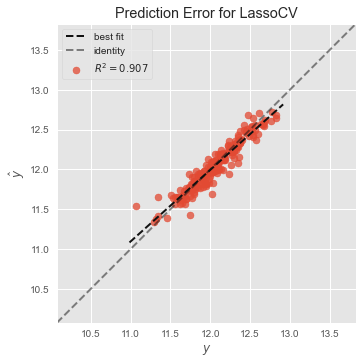

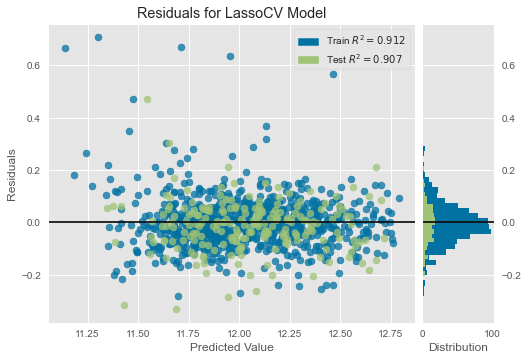

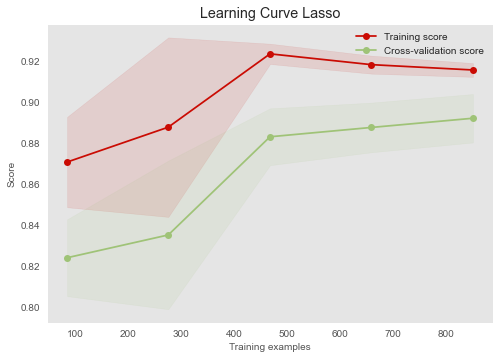

--------------------Ridge--------------------


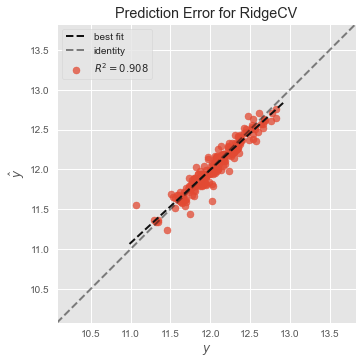

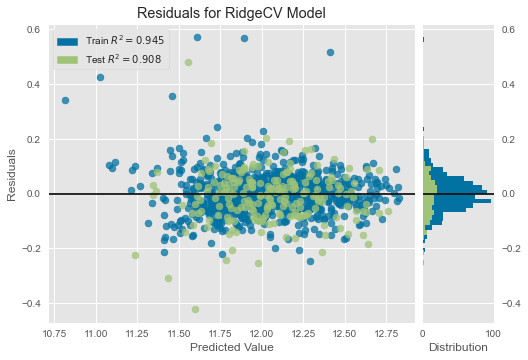

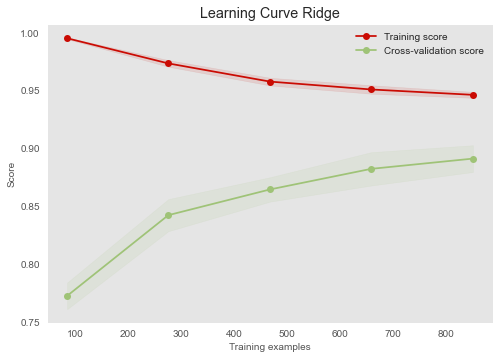

--------------------XGBoost--------------------


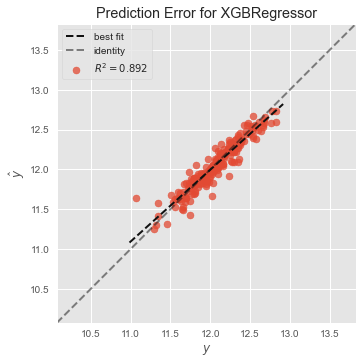

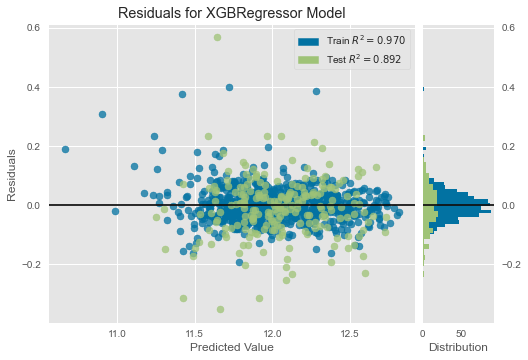

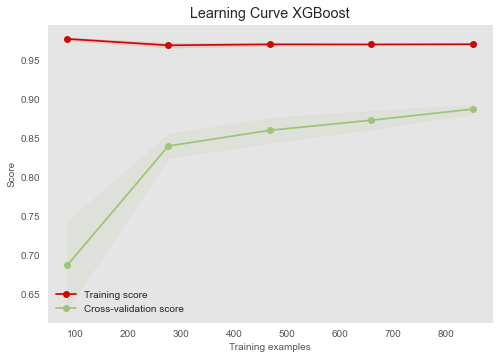

--------------------GBR--------------------


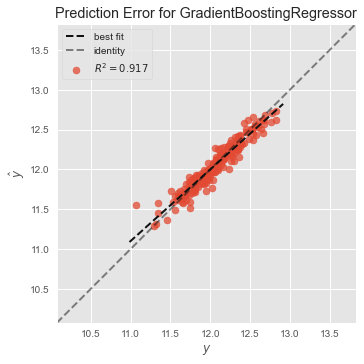

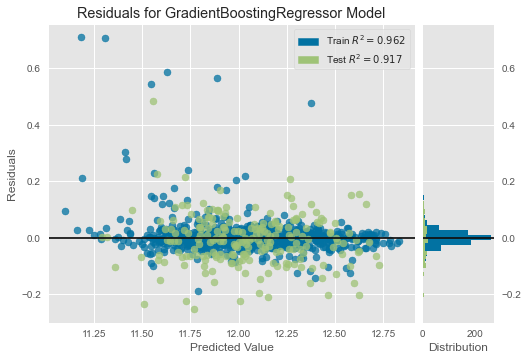

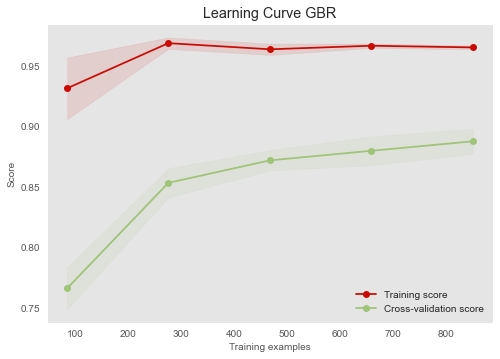

--------------------Random Forest--------------------


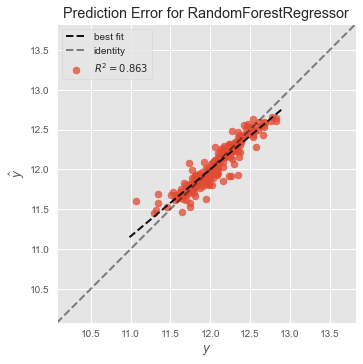

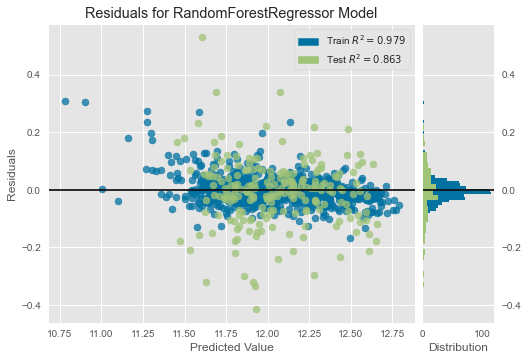

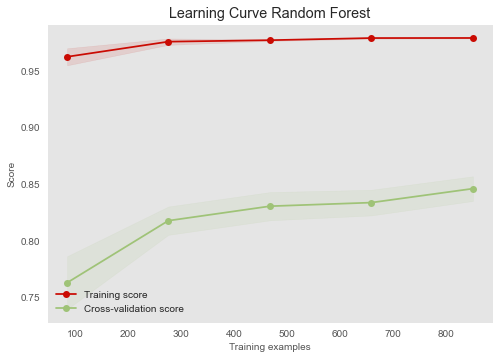

Wall time: 9min 16s


In [79]:
%%time
models = [lasso, ridgeCV, xgb_rand, gb_reg, RF_reg]
str_mod = ['Lasso', 'Ridge', 'XGBoost', 'GBR', 'Random Forest']
for model, str_ in zip(models, str_mod):
    print('--'*10 + str_ + '--'*10)
    visualizer = rg.PredictionError(model)
    visualizer.fit(X_train, Y_train)
    visualizer.score(X_test, Y_test)
    visualizer.show()
    
    visualizer1 = rg.ResidualsPlot(model)
    visualizer1.fit(X_train, Y_train)
    visualizer1.score(X_test, Y_test)
    visualizer1.show()
    
    skplt.estimators.plot_learning_curve(model, X, y)
    plt.title('Learning Curve ' + str_)
    plt.show()

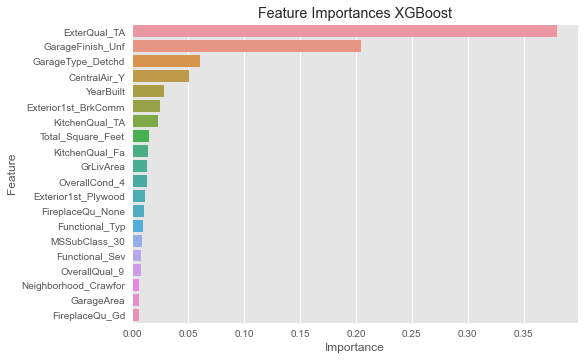

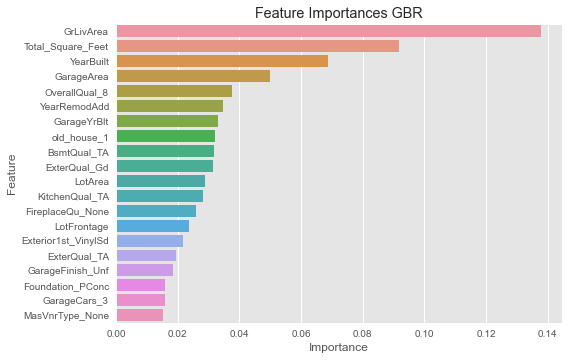

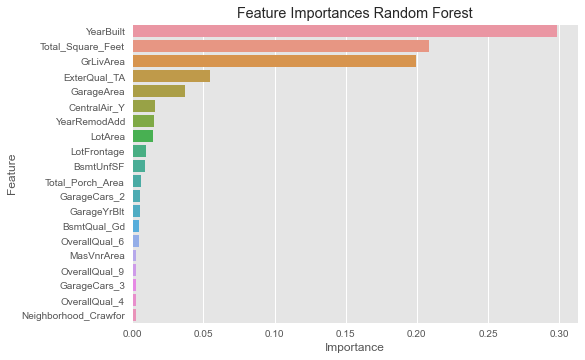

In [103]:
# Feature importances 
FI_models = [xgb_rand, gb_reg, RF_reg]
str_models = ['XGBoost', 'GBR', 'Random Forest']
for model, str_ in zip(FI_models, str_models):    
    FI = pd.DataFrame(list(zip(X.columns, model.feature_importances_)), 
             columns = ['Feature', 'Importance']).sort_values('Importance', ascending = False)
    sns.barplot(y = FI.Feature.head(20), x = FI.Importance.head(20))
    plt.title('Feature Importances ' + str_)
    plt.show()

*********************************************************************************************************